In [1]:
import os 
os.environ['KAGGLE_CONFIG_DIR']='/content'

In [2]:
!kaggle datasets download -d hemanthsai7/solar-panel-dust-detection

100% 1.18G/1.18G [00:15<00:00, 94.2MB/s]
100% 1.18G/1.18G [00:15<00:00, 83.5MB/s]


In [3]:
!unzip \*.zip && rm *.zip

Archive:  solar-panel-dust-detection.zip
  inflating: Detect_solar_dust/Clean/Imgclean_0_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1000_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1001_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1002_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1003_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1004_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1005_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1006_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1007_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1008_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1009_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_100_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1010_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1011_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1012_0.jpg  
  inflating: Detect_solar_dust/Clean/Imgclean_1013_0.jpg  
  inflating: Detect

In [4]:
cd/content/Detect_solar_dust

/content/Detect_solar_dust


In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm import tqdm
import os
!pip install utils
from utils import *
from glob import glob
from sklearn.model_selection import train_test_split
from itertools import chain
from datetime import datetime
import statistics
import cv2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [7]:
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.activations import sigmoid
from tensorflow. keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D,GlobalAveragePooling2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.metrics import Accuracy, Precision, Recall, AUC, BinaryAccuracy, FalsePositives
from tensorflow.keras.callbacks import CSVLogger, ModelCheckpoint
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.applications import DenseNet121, DenseNet169, DenseNet201, VGG16, ResNet50
from keras import backend as K
from tensorflow.keras import Sequential
from sklearn.metrics import confusion_matrix,classification_report
import keras
import matplotlib
from sklearn.metrics import roc_curve, auc, roc_auc_score
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler 
from sklearn.metrics import roc_curve, auc
print('Started')

Started


In [8]:
path, dirs, files = next (os.walk ("/content/Detect_solar_dust/Clean"))
file_count = len(files)
print('Clean: ', file_count)
path, dirs, files = next (os.walk("/content/Detect_solar_dust/Dusty"))
file_count = len(files)
print('Dusty: ',file_count)

Clean:  1493
Dusty:  1069


In [ ]:
# image_size = (224, 224)
# batch_size = 32
# train_df = tf.keras.preprocessing.image_dataset_from_directory(
# "/content/Detect_solar_dust",
# validation_split=0.30,
# subset= "training",
# seed=1337,
# image_size=image_size,
# batch_size=batch_size
# )
# test_df = tf.keras.preprocessing.image_dataset_from_directory(
# "/content/Detect_solar_dust",
# validation_split=0.30,
# subset="validation",
# seed=333,
# image_size=image_size,
# batch_size=batch_size,
# shuffle=False
# )
# val_df = tf.keras.preprocessing.image_dataset_from_directory(
# "/content/Detect_solar_dust",
# validation_split=0.15,
# subset="validation",
# seed=333,
# image_size=image_size,
# batch_size=batch_size
# )

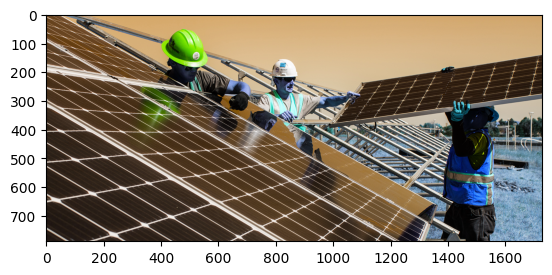

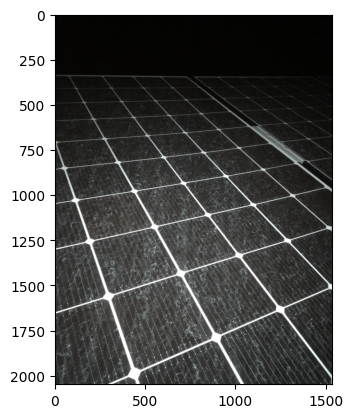

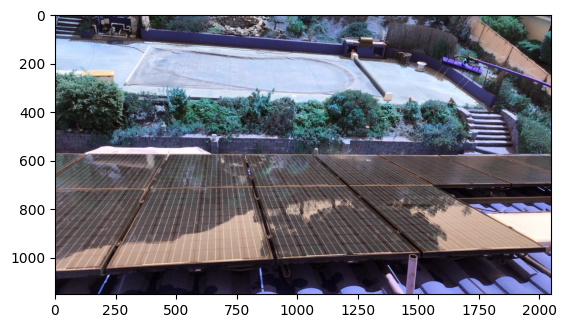

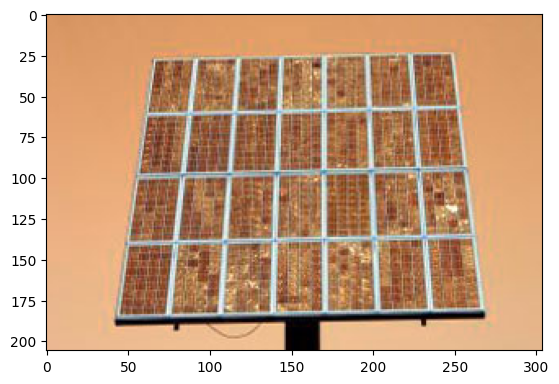

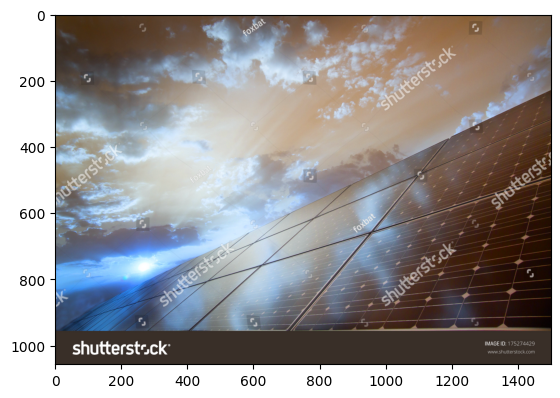

...

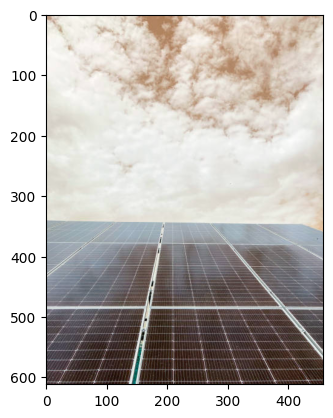

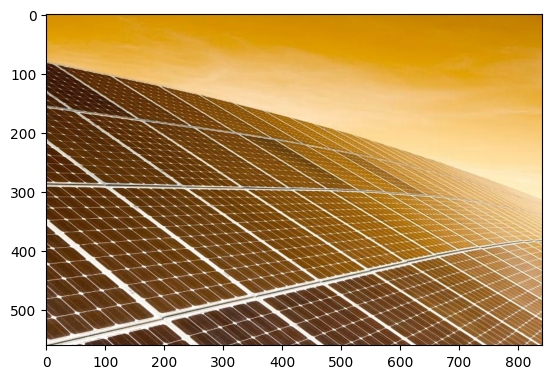

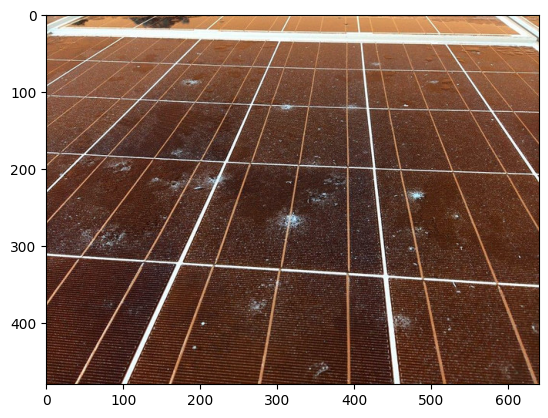

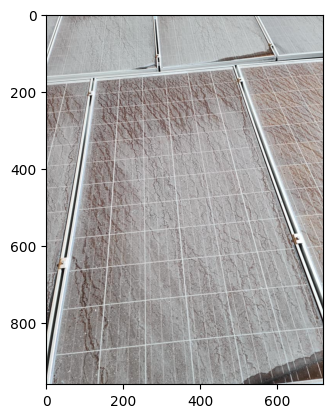

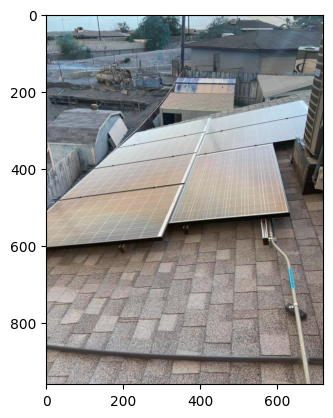

In [9]:
data_dir = '/content/Detect_solar_dust'

categories=["Clean","Dusty"]

for category in categories:
    path=os.path.join(data_dir,category)
    x=0
    for img in os.listdir(path):
        x+=1
        img_array=cv2.imread(os.path.join(path,img))
        plt.imshow(img_array)
        plt.show()
        if x==10:
            break

In [10]:
print(img_array)
print(img_array.shape)

[[[194 229 239]
  [194 229 239]
  [194 229 239]
  ...
  [ 86 101 110]
  [ 93 108 117]
  [ 76  91 100]]

 [[194 229 239]
  [194 229 239]
  [194 229 239]
  ...
  [ 90 105 114]
  [ 94 109 118]
  [ 83  98 107]]

 [[194 229 239]
  [194 229 239]
  [194 229 239]
  ...
  [ 77  94 103]
  [ 81  96 105]
  [ 83  98 107]]

 ...

 [[173 178 177]
  [178 183 182]
  [171 173 173]
  ...
  [154 139 137]
  [153 138 136]
  [146 131 129]]

 [[178 183 182]
  [186 191 190]
  [177 179 179]
  ...
  [180 165 163]
  [165 150 148]
  [128 113 111]]

 [[192 197 196]
  [200 205 204]
  [189 191 191]
  ...
  [180 165 163]
  [153 138 136]
  [ 96  81  79]]]
(960, 720, 3)


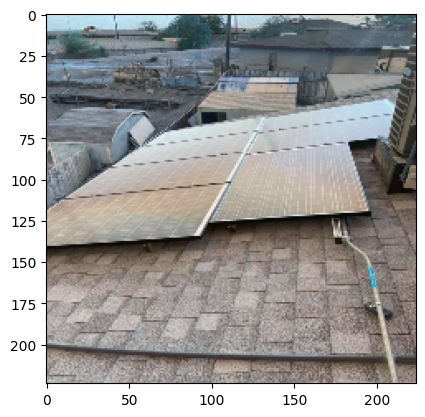

In [11]:
img_size=224

new_array=cv2.resize(img_array,(img_size,img_size))
plt.imshow(new_array)
plt.show()

In [12]:
training_data=[]

def create_training_data():
    for category in categories:
        path=os.path.join(data_dir,category)
        class_num=categories.index(category)
        for img in tqdm(os.listdir(path)):
            try:
                img_array=cv2.imread(os.path.join(path,img))
                new_array=cv2.resize(img_array,(img_size,img_size))
                training_data.append([new_array,class_num])
            except Exception as e:
                pass
            
create_training_data()

100%|██████████| 1069/1069 [00:28<00:00, 37.93it/s]


In [13]:
print(training_data[0])

[array([[[104,  68,  32],
        [100,  66,  27],
        [107,  72,  37],
        ...,
        [208, 163, 106],
        [209, 165, 106],
        [208, 164, 106]],

       [[104,  69,  34],
        [104,  68,  32],
        [102,  67,  30],
        ...,
        [209, 164, 107],
        [210, 165, 107],
        [209, 165, 106]],

       [[109,  69,  28],
        [104,  67,  32],
        [105,  69,  33],
        ...,
        [207, 164, 107],
        [208, 165, 108],
        [207, 166, 104]],

       ...,

       [[ 32,  23,  20],
        [ 32,  23,  19],
        [ 33,  24,  20],
        ...,
        [117, 152, 181],
        [116, 165, 202],
        [143, 184, 216]],

       [[ 35,  26,  22],
        [ 35,  25,  22],
        [ 33,  24,  20],
        ...,
        [139, 172, 198],
        [158, 190, 220],
        [127, 164, 198]],

       [[ 43,  31,  25],
        [ 34,  25,  21],
        [ 35,  26,  22],
        ...,
        [146, 164, 179],
        [ 98, 148, 179],
        [142, 179, 214]

In [ ]:
# import random
# random.shuffle(training_data)
# for sample in training_data[:10]:
#     print(sample[1])

In [14]:
x=[]
y=[]

for features,labels in training_data:
    x.append(features)
    y.append(labels)
    
x=np.array(x)
y=np.array(y)

In [15]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.15, random_state=1)
print(x_train.shape)
print(x_test.shape)
print(x_val.shape)
print(y_train.shape)
print(y_test.shape)

(1523, 224, 224, 3)
(769, 224, 224, 3)
(269, 224, 224, 3)
(1523,)
(769,)


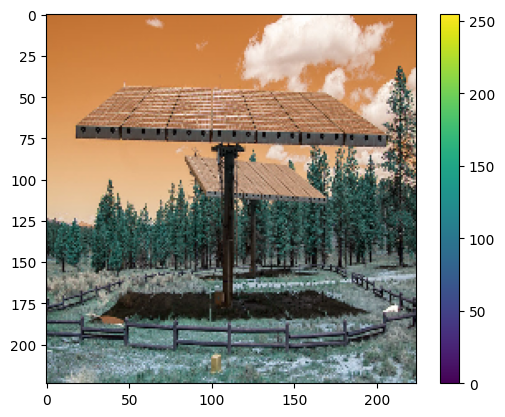

In [16]:
plt.figure()
plt.imshow(x_train[0])
plt.colorbar()
plt.grid(False)
plt.show()

In [ ]:
# x_train=x_train/255.0
# x_test=x_test/255.0

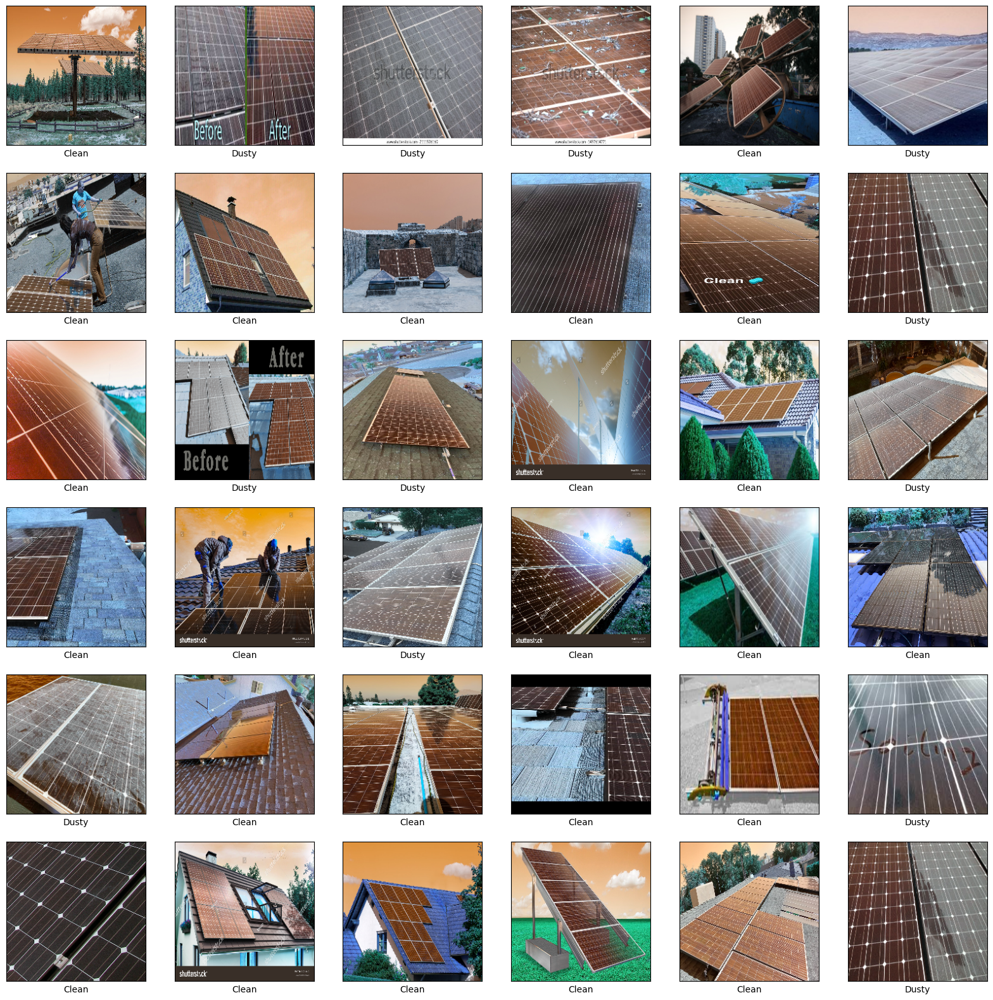

In [17]:
plt.figure(figsize=(20,20))
for i in range(36):
    plt.subplot(6,6,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(x_train[i])
    plt.xlabel(categories[y_train[i]])
plt.show()

In [ ]:
model2 = keras.models.Sequential([
        keras.layers.Conv2D(200,kernel_size=(3,3),activation='relu',input_shape=(img_size,img_size,3)),
        keras.layers.Conv2D(150,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Conv2D(120,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(80,kernel_size=(3,3),activation='relu'),    
        keras.layers.Conv2D(50,kernel_size=(3,3),activation='relu'),
        keras.layers.MaxPool2D(4,4),
        keras.layers.Flatten() ,    
        keras.layers.Dense(120,activation='relu') ,    
        keras.layers.Dense(100,activation='relu') ,    
        keras.layers.Dense(50,activation='relu') ,        
        keras.layers.Dropout(rate=0.5) ,            
        keras.layers.Dense(2,activation='softmax') ,    
        ])

In [ ]:
model2.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [ ]:
print('Model Details are : ')
print(model2.summary())

Model Details are : 
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 200)     5600      
                                                                 
 conv2d_1 (Conv2D)           (None, 220, 220, 150)     270150    
                                                                 
 max_pooling2d (MaxPooling2D  (None, 55, 55, 150)      0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 53, 53, 120)       162120    
                                                                 
 conv2d_3 (Conv2D)           (None, 51, 51, 80)        86480     
                                                                 
 conv2d_4 (Conv2D)           (None, 49, 49, 50)        36050     
                                   

In [ ]:
epochs=30
model2.fit(x_train, y_train, epochs=epochs,batch_size=64,verbose=1)

Epoch 1/30
24/24 [==============================] - 83s 2s/step - loss: 3.0583 - accuracy: 0.5404
Epoch 2/30
24/24 [==============================] - 29s 1s/step - loss: 0.6643 - accuracy: 0.5877
Epoch 3/30
24/24 [==============================] - 29s 1s/step - loss: 0.6708 - accuracy: 0.5962
Epoch 4/30
24/24 [==============================] - 29s 1s/step - loss: 0.6621 - accuracy: 0.5811
Epoch 5/30
24/24 [==============================] - 30s 1s/step - loss: 0.6505 - accuracy: 0.5903
Epoch 6/30
24/24 [==============================] - 30s 1s/step - loss: 0.6180 - accuracy: 0.6513
Epoch 7/30
24/24 [==============================] - 30s 1s/step - loss: 0.6495 - accuracy: 0.6415
Epoch 8/30
24/24 [==============================] - 30s 1s/step - loss: 0.6221 - accuracy: 0.6710
Epoch 9/30
24/24 [==============================] - 30s 1s/step - loss: 0.6118 - accuracy: 0.6868
Epoch 10/30
24/24 [==============================] - 30s 1s/step - loss: 0.5895 - accuracy: 0.7012
Epoch 11/30
24/24 [

In [ ]:
ModelLoss, ModelAccuracy = model2.evaluate(x_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

25/25 [==============================] - 9s 167ms/step - loss: 2.3513 - accuracy: 0.6892
Test Loss is 2.351321220397949
Test Accuracy is 0.6892067790031433


In [ ]:
y_pred = model2.predict(x_test)

print('Prediction Shape is {}'.format(y_pred.shape))

25/25 [==============================] - 4s 160ms/step
Prediction Shape is (769, 2)


In [ ]:
X_pred_array = np.array(x_val)

y_result = model2.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

9/9 [==============================] - 3s 428ms/step
Prediction Shape is (269, 2)


In [ ]:
code = {'Clean':0 ,'Dusty':1}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x 

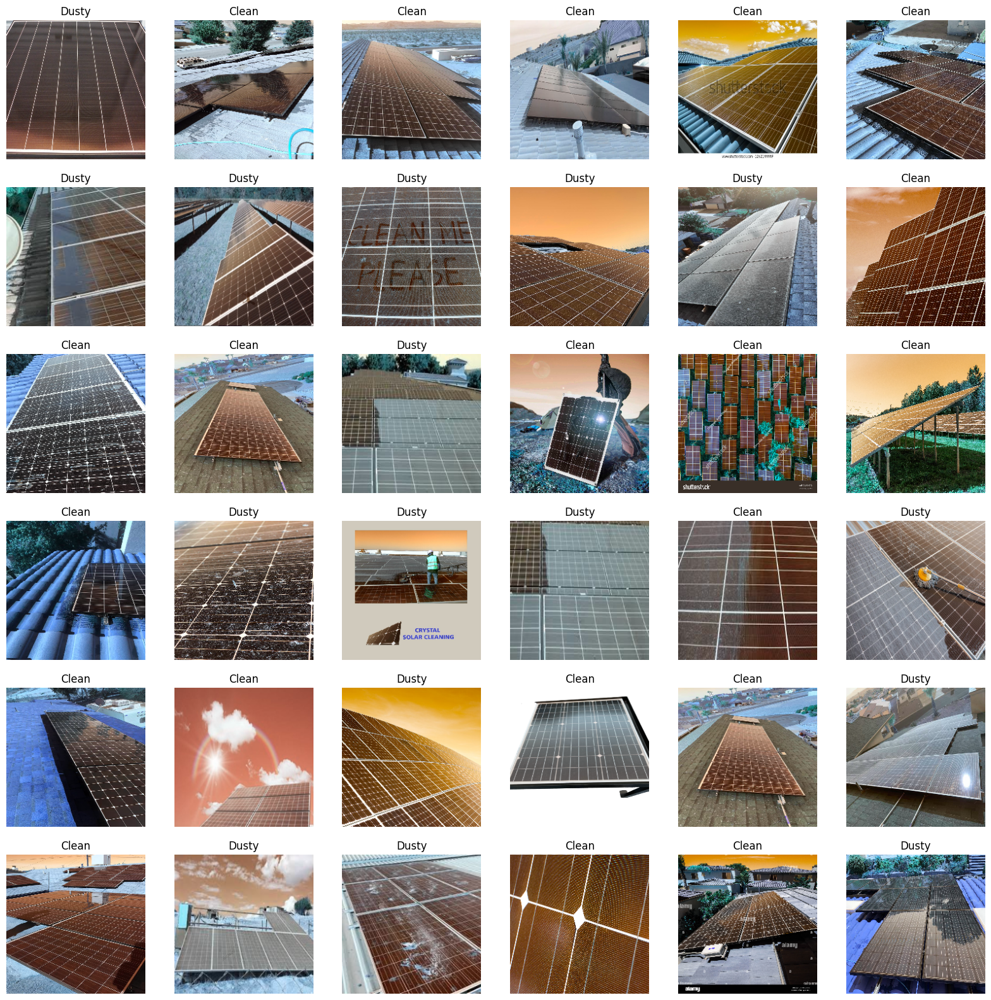

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(x_val),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(x_val[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))

In [18]:
img_size=224
img_shape=(img_size,img_size,3)
loss= BinaryCrossentropy() 
img_size=(300,300)
seed =33
batch_size=64

In [19]:
def get_callbacks (model_name):
    callbacks =[]
    checkpoint = tf.keras.callbacks. ModelCheckpoint (filepath=f'model. {model_name}. h5', 
                                                      verbose=1, monitor='val_loss', mode='min')
    callbacks.append(checkpoint)
    anne = ReduceLROnPlateau (monitor = 'val_loss', factor=0.5, patience=5, verbose=2,
                        min_lr=0.0000001,min_delta=0.00001 ,mode='auto' )
    callbacks.append(anne)
    early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0,
    patience=10,
    verbose=0,
    mode="auto",
    baseline=None,
    restore_best_weights=False,
    start_from_epoch=0,
)
   # earlystop = tf.keras.callbacks.arlyStopping(monitor='val_loss', patience=10) 
    callbacks.append(early_stopping)
    return callbacks

In [ ]:
OPTIMIZER =Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)

#base_model=tf.keras.applications.DenseNet121(input_shape=img_shape, include_top=False, weights="imagenet")
base_model=tf.keras.applications.DenseNet121(include_top=False,weights="imagenet",input_shape=img_shape,classifier_activation="softmax")
    
base_model.trainable = True

x=base_model.output

x=GlobalAveragePooling2D()(x)

predictions=Dense(1, activation='sigmoid',name='Final')(x) 
model=Model(inputs=base_model.input , outputs=predictions)

#model.Load_weights(dire)

model.compile(loss='binary_crossentropy',optimizer=OPTIMIZER, metrics=['accuracy',keras.metrics.Precision(),keras.metrics.Recall()])


29084464/29084464 [==============================] - 0s 0us/step


In [ ]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_5[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                       

In [ ]:
callbacks = get_callbacks('dense121')
history=model.fit( x_train, y_train, epochs=20, validation_data=( x_val,y_val),callbacks=[callbacks])

Epoch 1/20
48/48 [==============================] - ETA: 0s - loss: 0.6213 - accuracy: 0.7196 - precision_4: 0.6773 - recall_4: 0.6093
Epoch 1: saving model to model. dense121. h5


48/48 [==============================] - 164s 2s/step - loss: 0.6213 - accuracy: 0.7196 - precision_4: 0.6773 - recall_4: 0.6093 - val_loss: 194.5064 - val_accuracy: 0.4870 - val_precision_4: 0.3137 - val_recall_4: 0.1345 - lr: 0.0010
Epoch 2/20
48/48 [==============================] - ETA: 0s - loss: 0.4567 - accuracy: 0.7932 - precision_4: 0.7806 - recall_4: 0.6922
Epoch 2: saving model to model. dense121. h5


48/48 [==============================] - 78s 2s/step - loss: 0.4567 - accuracy: 0.7932 - precision_4: 0.7806 - recall_4: 0.6922 - val_loss: 43.2194 - val_accuracy: 0.5576 - val_precision_4: 0.0000e+00 - val_recall_4: 0.0000e+00 - lr: 0.0010
Epoch 3/20
48/48 [==============================] - ETA: 0s - loss: 0.3854 - accuracy: 0.8201 - precision_4: 0.7997 - recall_4: 0.7512
Epoch 3: saving model to model. dense121. h5


48/48 [==============================] - 80s 2s/step - loss: 0.3854 - accuracy: 0.8201 - precision_4: 0.7997 - recall_4: 0.7512 - val_loss: 1.0125 - val_accuracy: 0.6729 - val_precision_4: 0.6183 - val_recall_4: 0.6807 - lr: 0.0010
Epoch 4/20
48/48 [==============================] - ETA: 0s - loss: 0.3667 - accuracy: 0.8477 - precision_4: 0.8243 - recall_4: 0.8006
Epoch 4: saving model to model. dense121. h5


48/48 [==============================] - 78s 2s/step - loss: 0.3667 - accuracy: 0.8477 - precision_4: 0.8243 - recall_4: 0.8006 - val_loss: 1.4984 - val_accuracy: 0.6320 - val_precision_4: 0.6667 - val_recall_4: 0.3361 - lr: 0.0010
Epoch 5/20
48/48 [==============================] - ETA: 0s - loss: 0.3405 - accuracy: 0.8510 - precision_4: 0.8521 - recall_4: 0.7719
Epoch 5: saving model to model. dense121. h5


48/48 [==============================] - 77s 2s/step - loss: 0.3405 - accuracy: 0.8510 - precision_4: 0.8521 - recall_4: 0.7719 - val_loss: 1.5065 - val_accuracy: 0.7361 - val_precision_4: 0.7553 - val_recall_4: 0.5966 - lr: 0.0010
Epoch 6/20
48/48 [==============================] - ETA: 0s - loss: 0.2975 - accuracy: 0.8798 - precision_4: 0.8592 - recall_4: 0.8469
Epoch 6: saving model to model. dense121. h5


48/48 [==============================] - 78s 2s/step - loss: 0.2975 - accuracy: 0.8798 - precision_4: 0.8592 - recall_4: 0.8469 - val_loss: 2.4248 - val_accuracy: 0.6357 - val_precision_4: 0.7234 - val_recall_4: 0.2857 - lr: 0.0010
Epoch 7/20
48/48 [==============================] - ETA: 0s - loss: 0.3154 - accuracy: 0.8647 - precision_4: 0.8502 - recall_4: 0.8150
Epoch 7: saving model to model. dense121. h5


48/48 [==============================] - 79s 2s/step - loss: 0.3154 - accuracy: 0.8647 - precision_4: 0.8502 - recall_4: 0.8150 - val_loss: 1.0241 - val_accuracy: 0.6617 - val_precision_4: 0.9375 - val_recall_4: 0.2521 - lr: 0.0010
Epoch 8/20
48/48 [==============================] - ETA: 0s - loss: 0.3095 - accuracy: 0.8713 - precision_4: 0.8372 - recall_4: 0.8533
Epoch 8: saving model to model. dense121. h5



Epoch 8: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
48/48 [==============================] - 83s 2s/step - loss: 0.3095 - accuracy: 0.8713 - precision_4: 0.8372 - recall_4: 0.8533 - val_loss: 1.3140 - val_accuracy: 0.6506 - val_precision_4: 0.7551 - val_recall_4: 0.3109 - lr: 0.0010
Epoch 9/20
48/48 [==============================] - ETA: 0s - loss: 0.1763 - accuracy: 0.9284 - precision_4: 0.9288 - recall_4: 0.8947
Epoch 9: saving model to model. dense121. h5


48/48 [==============================] - 79s 2s/step - loss: 0.1763 - accuracy: 0.9284 - precision_4: 0.9288 - recall_4: 0.8947 - val_loss: 0.8712 - val_accuracy: 0.7138 - val_precision_4: 0.8750 - val_recall_4: 0.4118 - lr: 5.0000e-04
Epoch 10/20
48/48 [==============================] - ETA: 0s - loss: 0.1692 - accuracy: 0.9343 - precision_4: 0.9257 - recall_4: 0.9139
Epoch 10: saving model to model. dense121. h5


48/48 [==============================] - 77s 2s/step - loss: 0.1692 - accuracy: 0.9343 - precision_4: 0.9257 - recall_4: 0.9139 - val_loss: 0.9131 - val_accuracy: 0.7509 - val_precision_4: 0.8714 - val_recall_4: 0.5126 - lr: 5.0000e-04
Epoch 11/20
48/48 [==============================] - ETA: 0s - loss: 0.1030 - accuracy: 0.9619 - precision_4: 0.9452 - recall_4: 0.9633
Epoch 11: saving model to model. dense121. h5


48/48 [==============================] - 81s 2s/step - loss: 0.1030 - accuracy: 0.9619 - precision_4: 0.9452 - recall_4: 0.9633 - val_loss: 0.6698 - val_accuracy: 0.7993 - val_precision_4: 0.7731 - val_recall_4: 0.7731 - lr: 5.0000e-04
Epoch 12/20
48/48 [==============================] - ETA: 0s - loss: 0.0858 - accuracy: 0.9645 - precision_4: 0.9674 - recall_4: 0.9458
Epoch 12: saving model to model. dense121. h5


48/48 [==============================] - 79s 2s/step - loss: 0.0858 - accuracy: 0.9645 - precision_4: 0.9674 - recall_4: 0.9458 - val_loss: 0.7371 - val_accuracy: 0.8141 - val_precision_4: 0.8485 - val_recall_4: 0.7059 - lr: 5.0000e-04
Epoch 13/20
48/48 [==============================] - ETA: 0s - loss: 0.0899 - accuracy: 0.9691 - precision_4: 0.9633 - recall_4: 0.9617
Epoch 13: saving model to model. dense121. h5


48/48 [==============================] - 81s 2s/step - loss: 0.0899 - accuracy: 0.9691 - precision_4: 0.9633 - recall_4: 0.9617 - val_loss: 0.9212 - val_accuracy: 0.8327 - val_precision_4: 0.9205 - val_recall_4: 0.6807 - lr: 5.0000e-04
Epoch 14/20
48/48 [==============================] - ETA: 0s - loss: 0.0686 - accuracy: 0.9757 - precision_4: 0.9609 - recall_4: 0.9809
Epoch 14: saving model to model. dense121. h5


48/48 [==============================] - 80s 2s/step - loss: 0.0686 - accuracy: 0.9757 - precision_4: 0.9609 - recall_4: 0.9809 - val_loss: 1.5601 - val_accuracy: 0.7509 - val_precision_4: 0.9062 - val_recall_4: 0.4874 - lr: 5.0000e-04
Epoch 15/20
48/48 [==============================] - ETA: 0s - loss: 0.0743 - accuracy: 0.9764 - precision_4: 0.9758 - recall_4: 0.9665
Epoch 15: saving model to model. dense121. h5


48/48 [==============================] - 78s 2s/step - loss: 0.0743 - accuracy: 0.9764 - precision_4: 0.9758 - recall_4: 0.9665 - val_loss: 0.7880 - val_accuracy: 0.8253 - val_precision_4: 0.8273 - val_recall_4: 0.7647 - lr: 5.0000e-04
Epoch 16/20
48/48 [==============================] - ETA: 0s - loss: 0.1226 - accuracy: 0.9534 - precision_4: 0.9371 - recall_4: 0.9506
Epoch 16: saving model to model. dense121. h5



Epoch 16: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
48/48 [==============================] - 82s 2s/step - loss: 0.1226 - accuracy: 0.9534 - precision_4: 0.9371 - recall_4: 0.9506 - val_loss: 0.9449 - val_accuracy: 0.7435 - val_precision_4: 0.7604 - val_recall_4: 0.6134 - lr: 5.0000e-04
Epoch 17/20
48/48 [==============================] - ETA: 0s - loss: 0.0488 - accuracy: 0.9823 - precision_4: 0.9808 - recall_4: 0.9761
Epoch 17: saving model to model. dense121. h5


48/48 [==============================] - 82s 2s/step - loss: 0.0488 - accuracy: 0.9823 - precision_4: 0.9808 - recall_4: 0.9761 - val_loss: 0.6275 - val_accuracy: 0.8364 - val_precision_4: 0.8505 - val_recall_4: 0.7647 - lr: 2.5000e-04
Epoch 18/20
48/48 [==============================] - ETA: 0s - loss: 0.0278 - accuracy: 0.9902 - precision_4: 0.9857 - recall_4: 0.9904
Epoch 18: saving model to model. dense121. h5


48/48 [==============================] - 84s 2s/step - loss: 0.0278 - accuracy: 0.9902 - precision_4: 0.9857 - recall_4: 0.9904 - val_loss: 0.6029 - val_accuracy: 0.8253 - val_precision_4: 0.8000 - val_recall_4: 0.8067 - lr: 2.5000e-04
Epoch 19/20
48/48 [==============================] - ETA: 0s - loss: 0.0177 - accuracy: 0.9941 - precision_4: 0.9952 - recall_4: 0.9904
Epoch 19: saving model to model. dense121. h5


48/48 [==============================] - 78s 2s/step - loss: 0.0177 - accuracy: 0.9941 - precision_4: 0.9952 - recall_4: 0.9904 - val_loss: 0.6279 - val_accuracy: 0.8253 - val_precision_4: 0.8333 - val_recall_4: 0.7563 - lr: 2.5000e-04
Epoch 20/20
48/48 [==============================] - ETA: 0s - loss: 0.0267 - accuracy: 0.9902 - precision_4: 0.9842 - recall_4: 0.9920
Epoch 20: saving model to model. dense121. h5


48/48 [==============================] - 82s 2s/step - loss: 0.0267 - accuracy: 0.9902 - precision_4: 0.9842 - recall_4: 0.9920 - val_loss: 0.6939 - val_accuracy: 0.8476 - val_precision_4: 0.8611 - val_recall_4: 0.7815 - lr: 2.5000e-04


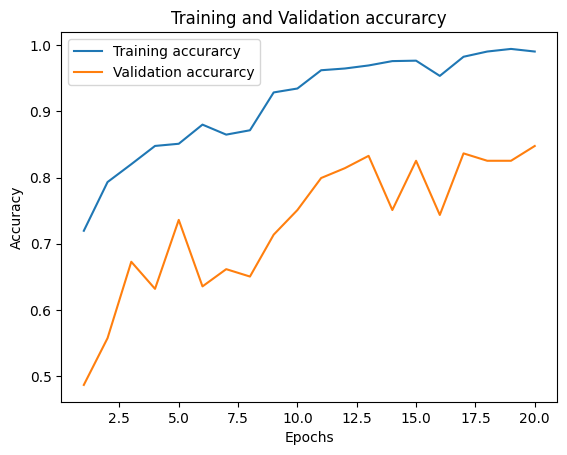

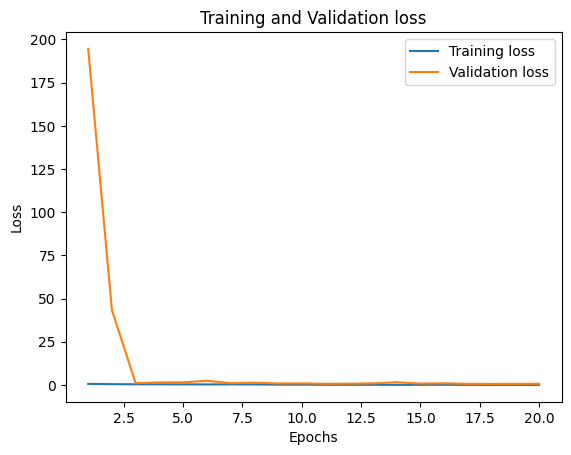

In [ ]:
acc=history.history['accuracy']
val_acc =history.history['val_accuracy']
loss=history.history['loss']
val_loss=history.history['val_loss']
epochs=range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, label='Training accurarcy') 
plt.plot(epochs, val_acc, label='Validation accurarcy') 
plt.title('Training and Validation accurarcy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
#Train and validation Loss
plt.figure()
plt.plot(epochs, loss,label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
model = keras.models.load_model('model. dense121. h5')

In [ ]:
results=model.evaluate(x_test,y_test, verbose=1)

25/25 [==============================] - 6s 129ms/step - loss: 0.6802 - accuracy: 0.8505 - precision_4: 0.8152 - recall_4: 0.8328


In [ ]:
x_test=np.array(x_test)
y_test=np.array(y_test)
y_pre = model.predict(x_test,verbose=1).round()
y_pre= y_pre.flatten()
from sklearn.metrics import classification_report
target_names=['clean', 'Dusty']
print(confusion_matrix(y_test, y_pre))
print(classification_report(y_test, y_pre, target_names=target_names, digits=4))

25/25 [==============================] - 4s 86ms/step
[[385  61]
 [ 54 269]]
              precision    recall  f1-score   support

       clean     0.8770    0.8632    0.8701       446
       Dusty     0.8152    0.8328    0.8239       323

    accuracy                         0.8505       769
   macro avg     0.8461    0.8480    0.8470       769
weighted avg     0.8510    0.8505    0.8507       769



In [ ]:
OPTIMIZER =Adam(learning_rate=0.0002, beta_1=0.9, beta_2=0.999)
base_model=tf.keras.applications.Xception(
    include_top=False,
    weights="imagenet",
    input_shape=img_shape,
    classifier_activation="softmax",
)
    
base_model.trainable = True

x=base_model.output

x=GlobalAveragePooling2D()(x)

predictions=Dense(1, activation='sigmoid',name='Final')(x) 
model=Model(inputs=base_model.input , outputs=predictions)

#model.Load_weights(dire)

model.compile(loss='binary_crossentropy',optimizer=OPTIMIZER,metrics=['accuracy',keras.metrics.Precision(),keras.metrics.Recall()])


83683744/83683744 [==============================] - 10s 0us/step


In [ ]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 111, 111, 32  864         ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 111, 111, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                      

In [ ]:
callbacks = get_callbacks('Xception')
history1=model.fit( x_train,y_train, epochs=20, validation_data= [x_val,y_val],callbacks=[callbacks])

Epoch 1/20
48/48 [==============================] - ETA: 0s - loss: 0.4803 - accuracy: 0.7649 - precision_5: 0.7231 - recall_5: 0.6954
Epoch 1: saving model to model. Xception. h5


48/48 [==============================] - 114s 2s/step - loss: 0.4803 - accuracy: 0.7649 - precision_5: 0.7231 - recall_5: 0.6954 - val_loss: 0.5084 - val_accuracy: 0.7695 - val_precision_5: 0.9385 - val_recall_5: 0.5126 - lr: 2.0000e-04
Epoch 2/20
48/48 [==============================] - ETA: 0s - loss: 0.1396 - accuracy: 0.9547 - precision_5: 0.9515 - recall_5: 0.9378
Epoch 2: saving model to model. Xception. h5


48/48 [==============================] - 73s 2s/step - loss: 0.1396 - accuracy: 0.9547 - precision_5: 0.9515 - recall_5: 0.9378 - val_loss: 0.6146 - val_accuracy: 0.7955 - val_precision_5: 0.9103 - val_recall_5: 0.5966 - lr: 2.0000e-04
Epoch 3/20
48/48 [==============================] - ETA: 0s - loss: 0.0451 - accuracy: 0.9888 - precision_5: 0.9888 - recall_5: 0.9841
Epoch 3: saving model to model. Xception. h5


48/48 [==============================] - 77s 2s/step - loss: 0.0451 - accuracy: 0.9888 - precision_5: 0.9888 - recall_5: 0.9841 - val_loss: 0.5477 - val_accuracy: 0.8439 - val_precision_5: 0.8667 - val_recall_5: 0.7647 - lr: 2.0000e-04
Epoch 4/20
48/48 [==============================] - ETA: 0s - loss: 0.0282 - accuracy: 0.9915 - precision_5: 0.9858 - recall_5: 0.9936
Epoch 4: saving model to model. Xception. h5


48/48 [==============================] - 80s 2s/step - loss: 0.0282 - accuracy: 0.9915 - precision_5: 0.9858 - recall_5: 0.9936 - val_loss: 0.6980 - val_accuracy: 0.8253 - val_precision_5: 0.9186 - val_recall_5: 0.6639 - lr: 2.0000e-04
Epoch 5/20
48/48 [==============================] - ETA: 0s - loss: 0.0169 - accuracy: 0.9928 - precision_5: 0.9920 - recall_5: 0.9904
Epoch 5: saving model to model. Xception. h5


48/48 [==============================] - 78s 2s/step - loss: 0.0169 - accuracy: 0.9928 - precision_5: 0.9920 - recall_5: 0.9904 - val_loss: 0.5441 - val_accuracy: 0.8550 - val_precision_5: 0.8704 - val_recall_5: 0.7899 - lr: 2.0000e-04
Epoch 6/20
48/48 [==============================] - ETA: 0s - loss: 0.0138 - accuracy: 0.9934 - precision_5: 0.9920 - recall_5: 0.9920
Epoch 6: saving model to model. Xception. h5



Epoch 6: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-05.
48/48 [==============================] - 83s 2s/step - loss: 0.0138 - accuracy: 0.9934 - precision_5: 0.9920 - recall_5: 0.9920 - val_loss: 0.8079 - val_accuracy: 0.8216 - val_precision_5: 0.8586 - val_recall_5: 0.7143 - lr: 2.0000e-04
Epoch 7/20
48/48 [==============================] - ETA: 0s - loss: 0.0213 - accuracy: 0.9928 - precision_5: 0.9904 - recall_5: 0.9920
Epoch 7: saving model to model. Xception. h5


48/48 [==============================] - 81s 2s/step - loss: 0.0213 - accuracy: 0.9928 - precision_5: 0.9904 - recall_5: 0.9920 - val_loss: 0.6299 - val_accuracy: 0.8476 - val_precision_5: 0.8482 - val_recall_5: 0.7983 - lr: 1.0000e-04
Epoch 8/20
48/48 [==============================] - ETA: 0s - loss: 0.0085 - accuracy: 0.9967 - precision_5: 0.9968 - recall_5: 0.9952
Epoch 8: saving model to model. Xception. h5


48/48 [==============================] - 85s 2s/step - loss: 0.0085 - accuracy: 0.9967 - precision_5: 0.9968 - recall_5: 0.9952 - val_loss: 0.6437 - val_accuracy: 0.8699 - val_precision_5: 0.8500 - val_recall_5: 0.8571 - lr: 1.0000e-04
Epoch 9/20
48/48 [==============================] - ETA: 0s - loss: 0.0103 - accuracy: 0.9947 - precision_5: 0.9952 - recall_5: 0.9920
Epoch 9: saving model to model. Xception. h5


48/48 [==============================] - 81s 2s/step - loss: 0.0103 - accuracy: 0.9947 - precision_5: 0.9952 - recall_5: 0.9920 - val_loss: 0.6276 - val_accuracy: 0.8662 - val_precision_5: 0.8320 - val_recall_5: 0.8739 - lr: 1.0000e-04
Epoch 10/20
48/48 [==============================] - ETA: 0s - loss: 0.0084 - accuracy: 0.9947 - precision_5: 0.9921 - recall_5: 0.9952
Epoch 10: saving model to model. Xception. h5


48/48 [==============================] - 85s 2s/step - loss: 0.0084 - accuracy: 0.9947 - precision_5: 0.9921 - recall_5: 0.9952 - val_loss: 0.6892 - val_accuracy: 0.8550 - val_precision_5: 0.8448 - val_recall_5: 0.8235 - lr: 1.0000e-04
Epoch 11/20
48/48 [==============================] - ETA: 0s - loss: 0.0080 - accuracy: 0.9954 - precision_5: 0.9952 - recall_5: 0.9936
Epoch 11: saving model to model. Xception. h5



Epoch 11: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
48/48 [==============================] - 83s 2s/step - loss: 0.0080 - accuracy: 0.9954 - precision_5: 0.9952 - recall_5: 0.9936 - val_loss: 0.7250 - val_accuracy: 0.8587 - val_precision_5: 0.8462 - val_recall_5: 0.8319 - lr: 1.0000e-04


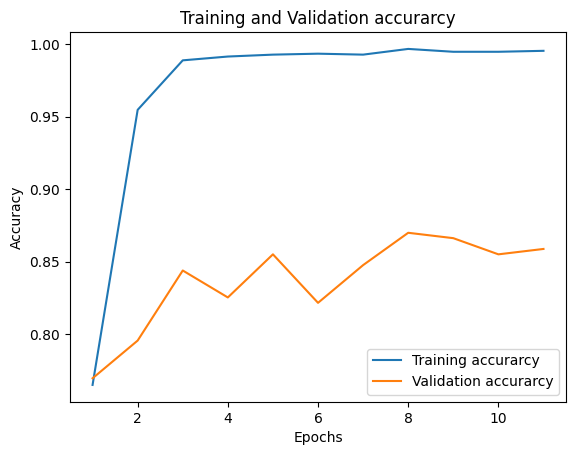

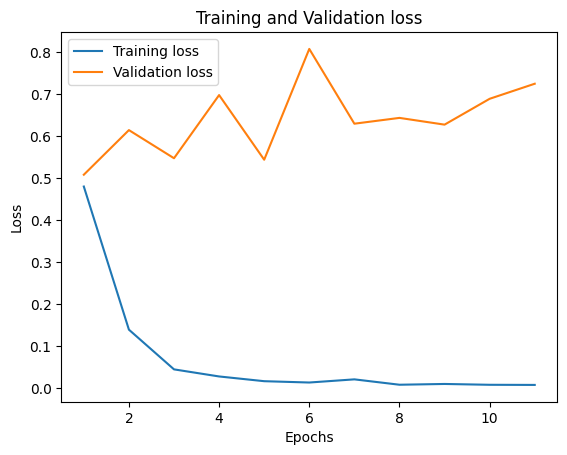

In [ ]:
acc=history1.history['accuracy']
val_acc =history1.history['val_accuracy']
loss=history1.history['loss']
val_loss=history1.history['val_loss']
epochs=range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, label='Training accurarcy') 
plt.plot(epochs, val_acc, label='Validation accurarcy') 
plt.title('Training and Validation accurarcy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
#Train and validation Loss
plt.figure()
plt.plot(epochs, loss,label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
model = keras.models.load_model('model. Xception. h5')

In [ ]:
results=model.evaluate(x_test,y_test, verbose=1)

25/25 [==============================] - 5s 146ms/step - loss: 0.5927 - accuracy: 0.8531 - precision_5: 0.8571 - recall_5: 0.7802


In [ ]:
x_test=np.array(x_test)
y_test=np.array(y_test)
y_pre = model.predict(x_test,verbose=1).round()
y_pre= y_pre.flatten()
from sklearn.metrics import classification_report
target_names=['clean', 'Dusty']
print(confusion_matrix(y_test,y_pre))
print(classification_report(y_test, y_pre, target_names=target_names, digits=4))

25/25 [==============================] - 4s 138ms/step
[[404  42]
 [ 71 252]]
              precision    recall  f1-score   support

       clean     0.8505    0.9058    0.8773       446
       Dusty     0.8571    0.7802    0.8169       323

    accuracy                         0.8531       769
   macro avg     0.8538    0.8430    0.8471       769
weighted avg     0.8533    0.8531    0.8519       769



In [ ]:
OPTIMIZER =Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
base_model=tf.keras.applications.VGG16(
    input_shape=img_shape,
    include_top=False,
    weights="imagenet",
    classifier_activation="softmax"
)

    
base_model.trainable = True

x=base_model.output

x=GlobalAveragePooling2D()(x)

predictions=Dense(1, activation='sigmoid',name='Final')(x) 
model=Model(inputs=base_model.input , outputs=predictions)

#model.Load_weights(dire)

model.compile(loss='binary_crossentropy',optimizer=OPTIMIZER,metrics=['accuracy',keras.metrics.Precision(),keras.metrics.Recall()])


58889256/58889256 [==============================] - 7s 0us/step


In [ ]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56

In [ ]:
callbacks = get_callbacks('VGG16')
history2=model.fit( x_train,y_train, epochs=20, validation_data= [x_val,y_val],callbacks=[callbacks])

Epoch 1/20
48/48 [==============================] - ETA: 0s - loss: 15.2347 - accuracy: 0.5561 - precision_6: 0.4054 - recall_6: 0.1675
Epoch 1: saving model to model. VGG16. h5


48/48 [==============================] - 79s 1s/step - loss: 15.2347 - accuracy: 0.5561 - precision_6: 0.4054 - recall_6: 0.1675 - val_loss: 0.6904 - val_accuracy: 0.5576 - val_precision_6: 0.0000e+00 - val_recall_6: 0.0000e+00 - lr: 0.0010
Epoch 2/20
48/48 [==============================] - ETA: 0s - loss: 0.7415 - accuracy: 0.5397 - precision_6: 0.3955 - recall_6: 0.2233
Epoch 2: saving model to model. VGG16. h5


48/48 [==============================] - 44s 927ms/step - loss: 0.7415 - accuracy: 0.5397 - precision_6: 0.3955 - recall_6: 0.2233 - val_loss: 0.6792 - val_accuracy: 0.5576 - val_precision_6: 0.0000e+00 - val_recall_6: 0.0000e+00 - lr: 0.0010
Epoch 3/20
48/48 [==============================] - ETA: 0s - loss: 0.6708 - accuracy: 0.5883 - precision_6: 0.0000e+00 - recall_6: 0.0000e+00
Epoch 3: saving model to model. VGG16. h5


48/48 [==============================] - 49s 1s/step - loss: 0.6708 - accuracy: 0.5883 - precision_6: 0.0000e+00 - recall_6: 0.0000e+00 - val_loss: 0.6696 - val_accuracy: 0.5576 - val_precision_6: 0.0000e+00 - val_recall_6: 0.0000e+00 - lr: 0.0010
Epoch 4/20
48/48 [==============================] - ETA: 0s - loss: 0.6715 - accuracy: 0.5883 - precision_6: 0.0000e+00 - recall_6: 0.0000e+00
Epoch 4: saving model to model. VGG16. h5


48/48 [==============================] - 61s 1s/step - loss: 0.6715 - accuracy: 0.5883 - precision_6: 0.0000e+00 - recall_6: 0.0000e+00 - val_loss: 0.6638 - val_accuracy: 0.5576 - val_precision_6: 0.0000e+00 - val_recall_6: 0.0000e+00 - lr: 0.0010
Epoch 5/20
48/48 [==============================] - ETA: 0s - loss: 0.6544 - accuracy: 0.5883 - precision_6: 0.0000e+00 - recall_6: 0.0000e+00
Epoch 5: saving model to model. VGG16. h5


48/48 [==============================] - 38s 803ms/step - loss: 0.6544 - accuracy: 0.5883 - precision_6: 0.0000e+00 - recall_6: 0.0000e+00 - val_loss: 0.6517 - val_accuracy: 0.5576 - val_precision_6: 0.0000e+00 - val_recall_6: 0.0000e+00 - lr: 0.0010
Epoch 6/20
48/48 [==============================] - ETA: 0s - loss: 0.6484 - accuracy: 0.6021 - precision_6: 0.8000 - recall_6: 0.0447
Epoch 6: saving model to model. VGG16. h5


48/48 [==============================] - 44s 931ms/step - loss: 0.6484 - accuracy: 0.6021 - precision_6: 0.8000 - recall_6: 0.0447 - val_loss: 0.6479 - val_accuracy: 0.5576 - val_precision_6: 0.0000e+00 - val_recall_6: 0.0000e+00 - lr: 0.0010
Epoch 7/20
48/48 [==============================] - ETA: 0s - loss: 0.6343 - accuracy: 0.6369 - precision_6: 0.6595 - recall_6: 0.2440
Epoch 7: saving model to model. VGG16. h5


48/48 [==============================] - 38s 803ms/step - loss: 0.6343 - accuracy: 0.6369 - precision_6: 0.6595 - recall_6: 0.2440 - val_loss: 0.6349 - val_accuracy: 0.6543 - val_precision_6: 0.8250 - val_recall_6: 0.2773 - lr: 0.0010
Epoch 8/20
48/48 [==============================] - ETA: 0s - loss: 0.6130 - accuracy: 0.6664 - precision_6: 0.6232 - recall_6: 0.4801
Epoch 8: saving model to model. VGG16. h5


48/48 [==============================] - 40s 832ms/step - loss: 0.6130 - accuracy: 0.6664 - precision_6: 0.6232 - recall_6: 0.4801 - val_loss: 0.6190 - val_accuracy: 0.7026 - val_precision_6: 0.7746 - val_recall_6: 0.4622 - lr: 0.0010
Epoch 9/20
48/48 [==============================] - ETA: 0s - loss: 0.6220 - accuracy: 0.6349 - precision_6: 0.6187 - recall_6: 0.2951
Epoch 9: saving model to model. VGG16. h5


48/48 [==============================] - 45s 940ms/step - loss: 0.6220 - accuracy: 0.6349 - precision_6: 0.6187 - recall_6: 0.2951 - val_loss: 0.6340 - val_accuracy: 0.6097 - val_precision_6: 0.7917 - val_recall_6: 0.1597 - lr: 0.0010
Epoch 10/20
48/48 [==============================] - ETA: 0s - loss: 0.6060 - accuracy: 0.6573 - precision_6: 0.5953 - recall_6: 0.5231
Epoch 10: saving model to model. VGG16. h5


48/48 [==============================] - 40s 833ms/step - loss: 0.6060 - accuracy: 0.6573 - precision_6: 0.5953 - recall_6: 0.5231 - val_loss: 0.6150 - val_accuracy: 0.6617 - val_precision_6: 0.5933 - val_recall_6: 0.7479 - lr: 0.0010
Epoch 11/20
48/48 [==============================] - ETA: 0s - loss: 0.5970 - accuracy: 0.6822 - precision_6: 0.6288 - recall_6: 0.5566
Epoch 11: saving model to model. VGG16. h5


48/48 [==============================] - 40s 843ms/step - loss: 0.5970 - accuracy: 0.6822 - precision_6: 0.6288 - recall_6: 0.5566 - val_loss: 0.6163 - val_accuracy: 0.6691 - val_precision_6: 0.6389 - val_recall_6: 0.5798 - lr: 0.0010
Epoch 12/20
48/48 [==============================] - ETA: 0s - loss: 0.5942 - accuracy: 0.6881 - precision_6: 0.6226 - recall_6: 0.6156
Epoch 12: saving model to model. VGG16. h5


48/48 [==============================] - 43s 916ms/step - loss: 0.5942 - accuracy: 0.6881 - precision_6: 0.6226 - recall_6: 0.6156 - val_loss: 0.6676 - val_accuracy: 0.6357 - val_precision_6: 0.7838 - val_recall_6: 0.2437 - lr: 0.0010
Epoch 13/20
48/48 [==============================] - ETA: 0s - loss: 0.5896 - accuracy: 0.6855 - precision_6: 0.6233 - recall_6: 0.5965
Epoch 13: saving model to model. VGG16. h5


48/48 [==============================] - 40s 835ms/step - loss: 0.5896 - accuracy: 0.6855 - precision_6: 0.6233 - recall_6: 0.5965 - val_loss: 0.6588 - val_accuracy: 0.5725 - val_precision_6: 0.8333 - val_recall_6: 0.0420 - lr: 0.0010
Epoch 14/20
48/48 [==============================] - ETA: 0s - loss: 0.6111 - accuracy: 0.6619 - precision_6: 0.6191 - recall_6: 0.4641
Epoch 14: saving model to model. VGG16. h5


48/48 [==============================] - 42s 886ms/step - loss: 0.6111 - accuracy: 0.6619 - precision_6: 0.6191 - recall_6: 0.4641 - val_loss: 0.6379 - val_accuracy: 0.5948 - val_precision_6: 0.9167 - val_recall_6: 0.0924 - lr: 0.0010
Epoch 15/20
48/48 [==============================] - ETA: 0s - loss: 0.5873 - accuracy: 0.6927 - precision_6: 0.6667 - recall_6: 0.5072
Epoch 15: saving model to model. VGG16. h5


48/48 [==============================] - 41s 858ms/step - loss: 0.5873 - accuracy: 0.6927 - precision_6: 0.6667 - recall_6: 0.5072 - val_loss: 0.5541 - val_accuracy: 0.7138 - val_precision_6: 0.6981 - val_recall_6: 0.6218 - lr: 0.0010
Epoch 16/20
48/48 [==============================] - ETA: 0s - loss: 0.5461 - accuracy: 0.7124 - precision_6: 0.6835 - recall_6: 0.5614
Epoch 16: saving model to model. VGG16. h5


48/48 [==============================] - 38s 801ms/step - loss: 0.5461 - accuracy: 0.7124 - precision_6: 0.6835 - recall_6: 0.5614 - val_loss: 0.6142 - val_accuracy: 0.6952 - val_precision_6: 0.7534 - val_recall_6: 0.4622 - lr: 0.0010
Epoch 17/20
48/48 [==============================] - ETA: 0s - loss: 0.5366 - accuracy: 0.7334 - precision_6: 0.7154 - recall_6: 0.5853
Epoch 17: saving model to model. VGG16. h5


48/48 [==============================] - 38s 801ms/step - loss: 0.5366 - accuracy: 0.7334 - precision_6: 0.7154 - recall_6: 0.5853 - val_loss: 0.5428 - val_accuracy: 0.7175 - val_precision_6: 0.6641 - val_recall_6: 0.7311 - lr: 0.0010
Epoch 18/20
48/48 [==============================] - ETA: 0s - loss: 0.5195 - accuracy: 0.7485 - precision_6: 0.7251 - recall_6: 0.6268
Epoch 18: saving model to model. VGG16. h5


48/48 [==============================] - 41s 870ms/step - loss: 0.5195 - accuracy: 0.7485 - precision_6: 0.7251 - recall_6: 0.6268 - val_loss: 0.5855 - val_accuracy: 0.7138 - val_precision_6: 0.8182 - val_recall_6: 0.4538 - lr: 0.0010
Epoch 19/20
48/48 [==============================] - ETA: 0s - loss: 0.5444 - accuracy: 0.7177 - precision_6: 0.6876 - recall_6: 0.5758
Epoch 19: saving model to model. VGG16. h5


48/48 [==============================] - 39s 811ms/step - loss: 0.5444 - accuracy: 0.7177 - precision_6: 0.6876 - recall_6: 0.5758 - val_loss: 0.5778 - val_accuracy: 0.7212 - val_precision_6: 0.6642 - val_recall_6: 0.7479 - lr: 0.0010
Epoch 20/20
48/48 [==============================] - ETA: 0s - loss: 0.5358 - accuracy: 0.7321 - precision_6: 0.7039 - recall_6: 0.6029
Epoch 20: saving model to model. VGG16. h5


48/48 [==============================] - 41s 872ms/step - loss: 0.5358 - accuracy: 0.7321 - precision_6: 0.7039 - recall_6: 0.6029 - val_loss: 0.6015 - val_accuracy: 0.6729 - val_precision_6: 0.7925 - val_recall_6: 0.3529 - lr: 0.0010


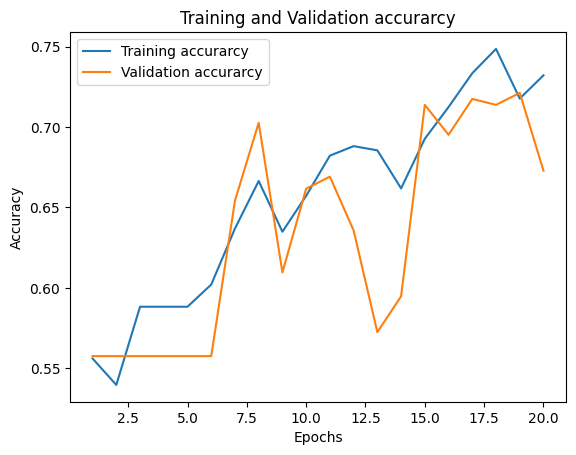

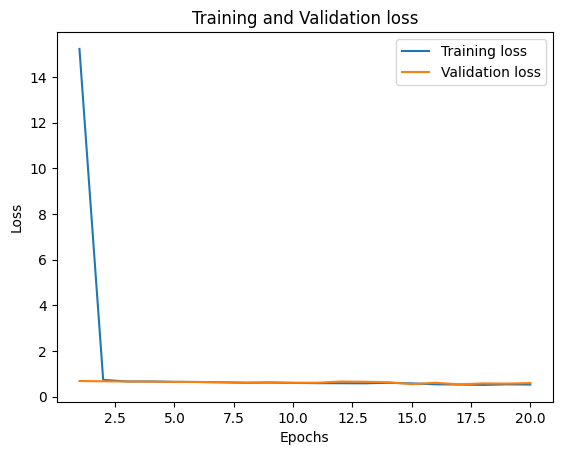

In [ ]:
acc=history2.history['accuracy']
val_acc =history2.history['val_accuracy']
loss=history2.history['loss']
val_loss=history2.history['val_loss']
epochs=range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, label='Training accurarcy') 
plt.plot(epochs, val_acc, label='Validation accurarcy') 
plt.title('Training and Validation accurarcy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
#Train and validation Loss
plt.figure()
plt.plot(epochs, loss,label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
model = keras.models.load_model('model. VGG16. h5')

In [ ]:
results=model.evaluate(x_test,y_test, verbose=1)

25/25 [==============================] - 4s 129ms/step - loss: 0.5825 - accuracy: 0.6996 - precision_6: 0.7949 - recall_6: 0.3839


In [ ]:
x_test=np.array(x_test)
y_test=np.array(y_test)
y_pre = model.predict(x_test,verbose=1).round()
y_pre= y_pre.flatten()
from sklearn.metrics import classification_report
target_names=['clean', 'Dusty']
print(confusion_matrix(y_test,y_pre))
print(classification_report(y_test, y_pre, target_names=target_names, digits=4))

25/25 [==============================] - 3s 114ms/step
[[414  32]
 [199 124]]
              precision    recall  f1-score   support

       clean     0.6754    0.9283    0.7819       446
       Dusty     0.7949    0.3839    0.5177       323

    accuracy                         0.6996       769
   macro avg     0.7351    0.6561    0.6498       769
weighted avg     0.7256    0.6996    0.6709       769



In [20]:
OPTIMIZER =Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
base_model=tf.keras.applications.ResNet152V2(
    input_shape=img_shape,
    include_top=False,
    weights="imagenet",
    classifier_activation="softmax"
)

    
base_model.trainable = True

x=base_model.output

x=GlobalAveragePooling2D()(x)

predictions=Dense(1, activation='sigmoid',name='Final')(x) 
model=Model(inputs=base_model.input , outputs=predictions)

#model.Load_weights(dire)

model.compile(loss='binary_crossentropy',optimizer=OPTIMIZER,metrics=['accuracy',keras.metrics.Precision(),keras.metrics.Recall()])


234545216/234545216 [==============================] - 1s 0us/step


In [21]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                         

In [22]:
callbacks = get_callbacks('ResNet152V2')
history3=model.fit( x_train,y_train, epochs=20, validation_data= [x_val,y_val],callbacks=[callbacks])

Epoch 1/20
48/48 [==============================] - ETA: 0s - loss: 0.6569 - accuracy: 0.6829 - precision: 0.6457 - recall: 0.5088
Epoch 1: saving model to model. ResNet152V2. h5


48/48 [==============================] - 232s 3s/step - loss: 0.6569 - accuracy: 0.6829 - precision: 0.6457 - recall: 0.5088 - val_loss: 123468.1250 - val_accuracy: 0.4424 - val_precision: 0.4424 - val_recall: 1.0000 - lr: 0.0010
Epoch 2/20
48/48 [==============================] - ETA: 0s - loss: 0.6066 - accuracy: 0.6881 - precision: 0.6570 - recall: 0.5072
Epoch 2: saving model to model. ResNet152V2. h5


48/48 [==============================] - 113s 2s/step - loss: 0.6066 - accuracy: 0.6881 - precision: 0.6570 - recall: 0.5072 - val_loss: 15.2253 - val_accuracy: 0.5242 - val_precision: 0.4749 - val_recall: 0.7143 - lr: 0.0010
Epoch 3/20
48/48 [==============================] - ETA: 0s - loss: 0.5879 - accuracy: 0.6993 - precision: 0.6961 - recall: 0.4785
Epoch 3: saving model to model. ResNet152V2. h5


48/48 [==============================] - 127s 3s/step - loss: 0.5879 - accuracy: 0.6993 - precision: 0.6961 - recall: 0.4785 - val_loss: 0.6938 - val_accuracy: 0.5688 - val_precision: 0.5517 - val_recall: 0.1345 - lr: 0.0010
Epoch 4/20
48/48 [==============================] - ETA: 0s - loss: 0.5466 - accuracy: 0.7439 - precision: 0.7559 - recall: 0.5582
Epoch 4: saving model to model. ResNet152V2. h5


48/48 [==============================] - 122s 3s/step - loss: 0.5466 - accuracy: 0.7439 - precision: 0.7559 - recall: 0.5582 - val_loss: 1.2096 - val_accuracy: 0.5576 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 0.0010
Epoch 5/20
48/48 [==============================] - ETA: 0s - loss: 0.5147 - accuracy: 0.7571 - precision: 0.7457 - recall: 0.6220
Epoch 5: saving model to model. ResNet152V2. h5


48/48 [==============================] - 126s 3s/step - loss: 0.5147 - accuracy: 0.7571 - precision: 0.7457 - recall: 0.6220 - val_loss: 2.5810 - val_accuracy: 0.5651 - val_precision: 1.0000 - val_recall: 0.0168 - lr: 0.0010
Epoch 6/20
48/48 [==============================] - ETA: 0s - loss: 0.4931 - accuracy: 0.7728 - precision: 0.7626 - recall: 0.6507
Epoch 6: saving model to model. ResNet152V2. h5


48/48 [==============================] - 121s 3s/step - loss: 0.4931 - accuracy: 0.7728 - precision: 0.7626 - recall: 0.6507 - val_loss: 1.6819 - val_accuracy: 0.5576 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 0.0010
Epoch 7/20
48/48 [==============================] - ETA: 0s - loss: 0.4987 - accuracy: 0.7761 - precision: 0.7771 - recall: 0.6396
Epoch 7: saving model to model. ResNet152V2. h5


48/48 [==============================] - 126s 3s/step - loss: 0.4987 - accuracy: 0.7761 - precision: 0.7771 - recall: 0.6396 - val_loss: 0.7160 - val_accuracy: 0.6431 - val_precision: 0.9600 - val_recall: 0.2017 - lr: 0.0010
Epoch 8/20
48/48 [==============================] - ETA: 0s - loss: 0.4755 - accuracy: 0.7800 - precision: 0.7704 - recall: 0.6635
Epoch 8: saving model to model. ResNet152V2. h5


48/48 [==============================] - 135s 3s/step - loss: 0.4755 - accuracy: 0.7800 - precision: 0.7704 - recall: 0.6635 - val_loss: 0.4890 - val_accuracy: 0.7770 - val_precision: 0.9275 - val_recall: 0.5378 - lr: 0.0010
Epoch 9/20
48/48 [==============================] - ETA: 0s - loss: 0.4578 - accuracy: 0.7945 - precision: 0.7814 - recall: 0.6954
Epoch 9: saving model to model. ResNet152V2. h5


48/48 [==============================] - 137s 3s/step - loss: 0.4578 - accuracy: 0.7945 - precision: 0.7814 - recall: 0.6954 - val_loss: 0.5651 - val_accuracy: 0.6989 - val_precision: 0.9130 - val_recall: 0.3529 - lr: 0.0010
Epoch 10/20
48/48 [==============================] - ETA: 0s - loss: 0.4607 - accuracy: 0.8030 - precision: 0.8011 - recall: 0.6938
Epoch 10: saving model to model. ResNet152V2. h5


48/48 [==============================] - 132s 3s/step - loss: 0.4607 - accuracy: 0.8030 - precision: 0.8011 - recall: 0.6938 - val_loss: 1.4318 - val_accuracy: 0.5651 - val_precision: 1.0000 - val_recall: 0.0168 - lr: 0.0010
Epoch 11/20
48/48 [==============================] - ETA: 0s - loss: 0.4544 - accuracy: 0.7958 - precision: 0.7792 - recall: 0.7033
Epoch 11: saving model to model. ResNet152V2. h5


48/48 [==============================] - 138s 3s/step - loss: 0.4544 - accuracy: 0.7958 - precision: 0.7792 - recall: 0.7033 - val_loss: 3.3543 - val_accuracy: 0.6022 - val_precision: 0.9286 - val_recall: 0.1092 - lr: 0.0010
Epoch 12/20
48/48 [==============================] - ETA: 0s - loss: 0.4102 - accuracy: 0.8214 - precision: 0.8142 - recall: 0.7337
Epoch 12: saving model to model. ResNet152V2. h5


48/48 [==============================] - 138s 3s/step - loss: 0.4102 - accuracy: 0.8214 - precision: 0.8142 - recall: 0.7337 - val_loss: 0.5598 - val_accuracy: 0.7100 - val_precision: 0.6358 - val_recall: 0.8067 - lr: 0.0010
Epoch 13/20
48/48 [==============================] - ETA: 0s - loss: 0.4193 - accuracy: 0.8083 - precision: 0.7923 - recall: 0.7241
Epoch 13: saving model to model. ResNet152V2. h5



Epoch 13: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
48/48 [==============================] - 137s 3s/step - loss: 0.4193 - accuracy: 0.8083 - precision: 0.7923 - recall: 0.7241 - val_loss: 0.9470 - val_accuracy: 0.6580 - val_precision: 0.9655 - val_recall: 0.2353 - lr: 0.0010
Epoch 14/20
48/48 [==============================] - ETA: 0s - loss: 0.3293 - accuracy: 0.8595 - precision: 0.8566 - recall: 0.7911
Epoch 14: saving model to model. ResNet152V2. h5


48/48 [==============================] - 133s 3s/step - loss: 0.3293 - accuracy: 0.8595 - precision: 0.8566 - recall: 0.7911 - val_loss: 0.5178 - val_accuracy: 0.8141 - val_precision: 0.8710 - val_recall: 0.6807 - lr: 5.0000e-04
Epoch 15/20
48/48 [==============================] - ETA: 0s - loss: 0.2503 - accuracy: 0.9041 - precision: 0.8962 - recall: 0.8676
Epoch 15: saving model to model. ResNet152V2. h5


48/48 [==============================] - 135s 3s/step - loss: 0.2503 - accuracy: 0.9041 - precision: 0.8962 - recall: 0.8676 - val_loss: 0.8267 - val_accuracy: 0.7695 - val_precision: 0.9385 - val_recall: 0.5126 - lr: 5.0000e-04
Epoch 16/20
48/48 [==============================] - ETA: 0s - loss: 0.2121 - accuracy: 0.9173 - precision: 0.9127 - recall: 0.8836
Epoch 16: saving model to model. ResNet152V2. h5


48/48 [==============================] - 133s 3s/step - loss: 0.2121 - accuracy: 0.9173 - precision: 0.9127 - recall: 0.8836 - val_loss: 1.1508 - val_accuracy: 0.7323 - val_precision: 0.7765 - val_recall: 0.5546 - lr: 5.0000e-04
Epoch 17/20
48/48 [==============================] - ETA: 0s - loss: 0.1907 - accuracy: 0.9278 - precision: 0.9149 - recall: 0.9091
Epoch 17: saving model to model. ResNet152V2. h5


48/48 [==============================] - 137s 3s/step - loss: 0.1907 - accuracy: 0.9278 - precision: 0.9149 - recall: 0.9091 - val_loss: 0.9716 - val_accuracy: 0.7509 - val_precision: 0.8421 - val_recall: 0.5378 - lr: 5.0000e-04
Epoch 18/20
48/48 [==============================] - ETA: 0s - loss: 0.1838 - accuracy: 0.9284 - precision: 0.9232 - recall: 0.9011
Epoch 18: saving model to model. ResNet152V2. h5



Epoch 18: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
48/48 [==============================] - 138s 3s/step - loss: 0.1838 - accuracy: 0.9284 - precision: 0.9232 - recall: 0.9011 - val_loss: 0.9203 - val_accuracy: 0.7361 - val_precision: 0.8750 - val_recall: 0.4706 - lr: 5.0000e-04


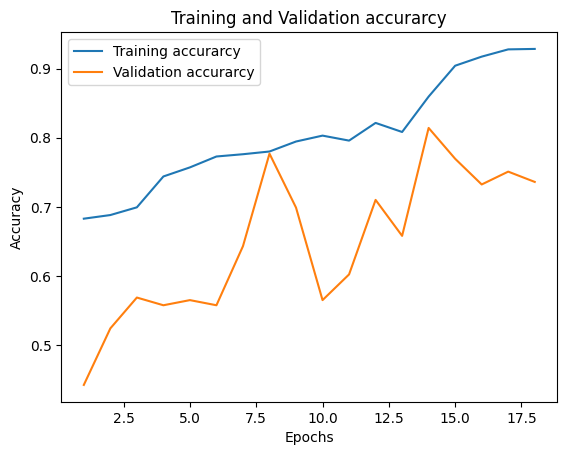

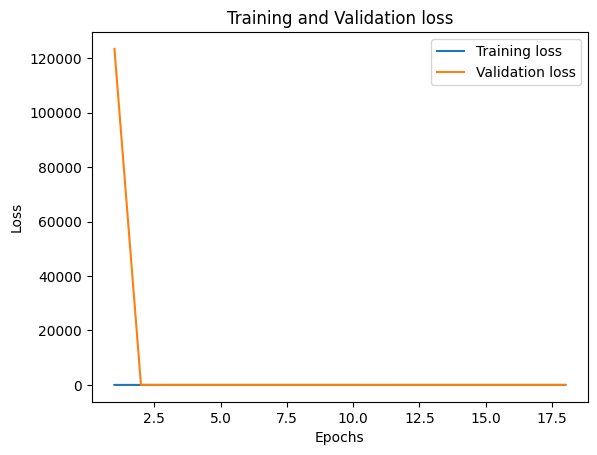

In [23]:
acc=history3.history['accuracy']
val_acc =history3.history['val_accuracy']
loss=history3.history['loss']
val_loss=history3.history['val_loss']
epochs=range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, label='Training accurarcy') 
plt.plot(epochs, val_acc, label='Validation accurarcy') 
plt.title('Training and Validation accurarcy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
#Train and validation Loss
plt.figure()
plt.plot(epochs, loss,label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [24]:
model = keras.models.load_model('model. ResNet152V2. h5')

In [25]:
results=model.evaluate(x_test,y_test, verbose=1)

25/25 [==============================] - 9s 249ms/step - loss: 0.9481 - accuracy: 0.7334 - precision: 0.8105 - recall: 0.4768


In [26]:
x_test=np.array(x_test)
y_test=np.array(y_test)
y_pre = model.predict(x_test,verbose=1).round()
y_pre= y_pre.flatten()
from sklearn.metrics import classification_report
target_names=['clean', 'Dusty']
print(confusion_matrix(y_test,y_pre))
print(classification_report(y_test, y_pre, target_names=target_names, digits=4))

25/25 [==============================] - 8s 235ms/step
[[410  36]
 [169 154]]
              precision    recall  f1-score   support

       clean     0.7081    0.9193    0.8000       446
       Dusty     0.8105    0.4768    0.6004       323

    accuracy                         0.7334       769
   macro avg     0.7593    0.6980    0.7002       769
weighted avg     0.7511    0.7334    0.7162       769



In [ ]:
OPTIMIZER =Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
base_model=tf.keras.applications.InceptionResNetV2(
    input_shape=img_shape,
    include_top=False,
    weights="imagenet",
    classifier_activation="softmax"
)

    
base_model.trainable = True

x=base_model.output

x=GlobalAveragePooling2D()(x)

predictions=Dense(1, activation='sigmoid',name='Final')(x) 
model=Model(inputs=base_model.input , outputs=predictions)

#model.Load_weights(dire)

model.compile(loss='binary_crossentropy',optimizer=OPTIMIZER,metrics=['accuracy',keras.metrics.Precision(),keras.metrics.Recall()])


219055592/219055592 [==============================] - 1s 0us/step


In [ ]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                        

In [ ]:
callbacks = get_callbacks('InceptionResNetV2')
history5=model.fit( x_train,y_train, epochs=20, validation_data= [x_val,y_val],callbacks=[callbacks])

Epoch 1/20
48/48 [==============================] - ETA: 0s - loss: 0.5570 - accuracy: 0.7682 - precision: 0.7306 - recall: 0.6922
Epoch 1: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 240s 3s/step - loss: 0.5570 - accuracy: 0.7682 - precision: 0.7306 - recall: 0.6922 - val_loss: 161.1146 - val_accuracy: 0.3086 - val_precision: 0.2231 - val_recall: 0.2269 - lr: 0.0010
Epoch 2/20
48/48 [==============================] - ETA: 0s - loss: 0.3580 - accuracy: 0.8647 - precision: 0.8713 - recall: 0.7879
Epoch 2: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 117s 2s/step - loss: 0.3580 - accuracy: 0.8647 - precision: 0.8713 - recall: 0.7879 - val_loss: 4.6255 - val_accuracy: 0.6803 - val_precision: 0.7895 - val_recall: 0.3782 - lr: 0.0010
Epoch 3/20
48/48 [==============================] - ETA: 0s - loss: 0.2797 - accuracy: 0.8903 - precision: 0.8795 - recall: 0.8501
Epoch 3: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 121s 3s/step - loss: 0.2797 - accuracy: 0.8903 - precision: 0.8795 - recall: 0.8501 - val_loss: 0.9472 - val_accuracy: 0.8327 - val_precision: 0.8776 - val_recall: 0.7227 - lr: 0.0010
Epoch 4/20
48/48 [==============================] - ETA: 0s - loss: 0.2022 - accuracy: 0.9225 - precision: 0.9033 - recall: 0.9091
Epoch 4: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 127s 3s/step - loss: 0.2022 - accuracy: 0.9225 - precision: 0.9033 - recall: 0.9091 - val_loss: 0.6079 - val_accuracy: 0.7212 - val_precision: 0.6264 - val_recall: 0.9160 - lr: 0.0010
Epoch 5/20
48/48 [==============================] - ETA: 0s - loss: 0.1465 - accuracy: 0.9488 - precision: 0.9449 - recall: 0.9298
Epoch 5: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 132s 3s/step - loss: 0.1465 - accuracy: 0.9488 - precision: 0.9449 - recall: 0.9298 - val_loss: 1.1437 - val_accuracy: 0.8067 - val_precision: 0.8941 - val_recall: 0.6387 - lr: 0.0010
Epoch 6/20
48/48 [==============================] - ETA: 0s - loss: 0.1428 - accuracy: 0.9521 - precision: 0.9411 - recall: 0.9426
Epoch 6: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 137s 3s/step - loss: 0.1428 - accuracy: 0.9521 - precision: 0.9411 - recall: 0.9426 - val_loss: 1.0106 - val_accuracy: 0.6989 - val_precision: 0.6131 - val_recall: 0.8655 - lr: 0.0010
Epoch 7/20
48/48 [==============================] - ETA: 0s - loss: 0.1304 - accuracy: 0.9593 - precision: 0.9506 - recall: 0.9506
Epoch 7: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 138s 3s/step - loss: 0.1304 - accuracy: 0.9593 - precision: 0.9506 - recall: 0.9506 - val_loss: 1.5921 - val_accuracy: 0.7323 - val_precision: 0.9608 - val_recall: 0.4118 - lr: 0.0010
Epoch 8/20
48/48 [==============================] - ETA: 0s - loss: 0.0713 - accuracy: 0.9737 - precision: 0.9757 - recall: 0.9601
Epoch 8: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 140s 3s/step - loss: 0.0713 - accuracy: 0.9737 - precision: 0.9757 - recall: 0.9601 - val_loss: 0.7568 - val_accuracy: 0.8104 - val_precision: 0.7464 - val_recall: 0.8655 - lr: 0.0010
Epoch 9/20
48/48 [==============================] - ETA: 0s - loss: 0.1103 - accuracy: 0.9586 - precision: 0.9505 - recall: 0.9490
Epoch 9: saving model to model. InceptionResNetV2. h5



Epoch 9: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
48/48 [==============================] - 135s 3s/step - loss: 0.1103 - accuracy: 0.9586 - precision: 0.9505 - recall: 0.9490 - val_loss: 0.8239 - val_accuracy: 0.7993 - val_precision: 0.9012 - val_recall: 0.6134 - lr: 0.0010
Epoch 10/20
48/48 [==============================] - ETA: 0s - loss: 0.0564 - accuracy: 0.9790 - precision: 0.9670 - recall: 0.9825
Epoch 10: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 138s 3s/step - loss: 0.0564 - accuracy: 0.9790 - precision: 0.9670 - recall: 0.9825 - val_loss: 0.9201 - val_accuracy: 0.8104 - val_precision: 0.9250 - val_recall: 0.6218 - lr: 5.0000e-04
Epoch 11/20
48/48 [==============================] - ETA: 0s - loss: 0.0359 - accuracy: 0.9882 - precision: 0.9856 - recall: 0.9856
Epoch 11: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 137s 3s/step - loss: 0.0359 - accuracy: 0.9882 - precision: 0.9856 - recall: 0.9856 - val_loss: 0.6187 - val_accuracy: 0.8401 - val_precision: 0.7836 - val_recall: 0.8824 - lr: 5.0000e-04
Epoch 12/20
48/48 [==============================] - ETA: 0s - loss: 0.0202 - accuracy: 0.9934 - precision: 0.9874 - recall: 0.9968
Epoch 12: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 140s 3s/step - loss: 0.0202 - accuracy: 0.9934 - precision: 0.9874 - recall: 0.9968 - val_loss: 0.5790 - val_accuracy: 0.8327 - val_precision: 0.8136 - val_recall: 0.8067 - lr: 5.0000e-04
Epoch 13/20
48/48 [==============================] - ETA: 0s - loss: 0.0104 - accuracy: 0.9947 - precision: 0.9952 - recall: 0.9920
Epoch 13: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 141s 3s/step - loss: 0.0104 - accuracy: 0.9947 - precision: 0.9952 - recall: 0.9920 - val_loss: 0.6492 - val_accuracy: 0.8736 - val_precision: 0.8696 - val_recall: 0.8403 - lr: 5.0000e-04
Epoch 14/20
48/48 [==============================] - ETA: 0s - loss: 0.0075 - accuracy: 0.9967 - precision: 0.9968 - recall: 0.9952
Epoch 14: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 139s 3s/step - loss: 0.0075 - accuracy: 0.9967 - precision: 0.9968 - recall: 0.9952 - val_loss: 0.7267 - val_accuracy: 0.8513 - val_precision: 0.8264 - val_recall: 0.8403 - lr: 5.0000e-04
Epoch 15/20
48/48 [==============================] - ETA: 0s - loss: 0.0076 - accuracy: 0.9967 - precision: 0.9984 - recall: 0.9936
Epoch 15: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 138s 3s/step - loss: 0.0076 - accuracy: 0.9967 - precision: 0.9984 - recall: 0.9936 - val_loss: 0.8007 - val_accuracy: 0.8699 - val_precision: 0.8684 - val_recall: 0.8319 - lr: 5.0000e-04
Epoch 16/20
48/48 [==============================] - ETA: 0s - loss: 0.0093 - accuracy: 0.9961 - precision: 0.9936 - recall: 0.9968
Epoch 16: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 131s 3s/step - loss: 0.0093 - accuracy: 0.9961 - precision: 0.9936 - recall: 0.9968 - val_loss: 0.8131 - val_accuracy: 0.8550 - val_precision: 0.8333 - val_recall: 0.8403 - lr: 5.0000e-04
Epoch 17/20
48/48 [==============================] - ETA: 0s - loss: 0.0073 - accuracy: 0.9954 - precision: 0.9921 - recall: 0.9968
Epoch 17: saving model to model. InceptionResNetV2. h5



Epoch 17: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
48/48 [==============================] - 132s 3s/step - loss: 0.0073 - accuracy: 0.9954 - precision: 0.9921 - recall: 0.9968 - val_loss: 1.2472 - val_accuracy: 0.8327 - val_precision: 0.8627 - val_recall: 0.7395 - lr: 5.0000e-04
Epoch 18/20
48/48 [==============================] - ETA: 0s - loss: 0.0143 - accuracy: 0.9947 - precision: 0.9936 - recall: 0.9936
Epoch 18: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 132s 3s/step - loss: 0.0143 - accuracy: 0.9947 - precision: 0.9936 - recall: 0.9936 - val_loss: 1.0391 - val_accuracy: 0.8401 - val_precision: 0.8519 - val_recall: 0.7731 - lr: 2.5000e-04
Epoch 19/20
48/48 [==============================] - ETA: 0s - loss: 0.0066 - accuracy: 0.9961 - precision: 0.9968 - recall: 0.9936
Epoch 19: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 132s 3s/step - loss: 0.0066 - accuracy: 0.9961 - precision: 0.9968 - recall: 0.9936 - val_loss: 0.9438 - val_accuracy: 0.8550 - val_precision: 0.8448 - val_recall: 0.8235 - lr: 2.5000e-04
Epoch 20/20
48/48 [==============================] - ETA: 0s - loss: 0.0056 - accuracy: 0.9974 - precision: 0.9952 - recall: 0.9984
Epoch 20: saving model to model. InceptionResNetV2. h5


48/48 [==============================] - 135s 3s/step - loss: 0.0056 - accuracy: 0.9974 - precision: 0.9952 - recall: 0.9984 - val_loss: 0.9660 - val_accuracy: 0.8476 - val_precision: 0.8197 - val_recall: 0.8403 - lr: 2.5000e-04


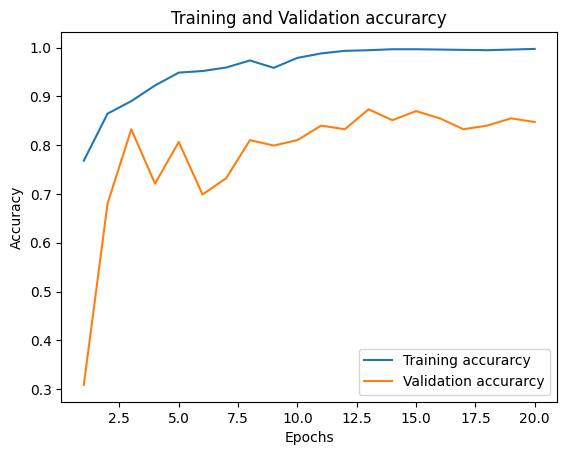

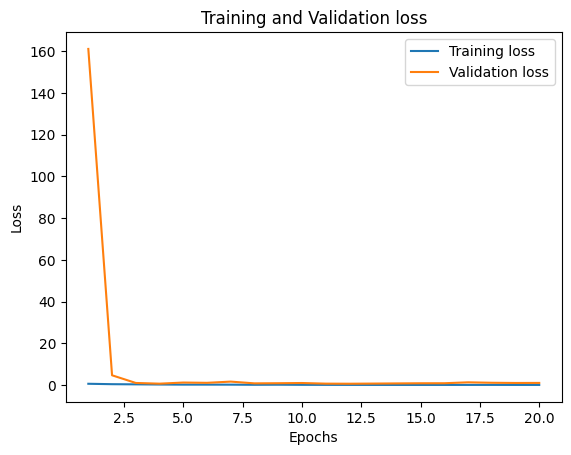

In [ ]:
acc=history5.history['accuracy']
val_acc =history5.history['val_accuracy']
loss=history5.history['loss']
val_loss=history5.history['val_loss']
epochs=range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, label='Training accurarcy') 
plt.plot(epochs, val_acc, label='Validation accurarcy') 
plt.title('Training and Validation accurarcy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
#Train and validation Loss
plt.figure()
plt.plot(epochs, loss,label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
model = keras.models.load_model('model. InceptionResNetV2. h5')

In [ ]:
results=model.evaluate(x_test,y_test, verbose=1)

25/25 [==============================] - 9s 191ms/step - loss: 0.9387 - accuracy: 0.8375 - precision: 0.7845 - recall: 0.8452


In [ ]:
x_test=np.array(x_test)
y_test=np.array(y_test)
y_pre = model.predict(x_test,verbose=1).round()
y_pre= y_pre.flatten()
from sklearn.metrics import classification_report
target_names=['clean', 'Dusty']
print(confusion_matrix(y_test,y_pre))
print(classification_report(y_test, y_pre, target_names=target_names, digits=4))

25/25 [==============================] - 7s 158ms/step
[[371  75]
 [ 50 273]]
              precision    recall  f1-score   support

       clean     0.8812    0.8318    0.8558       446
       Dusty     0.7845    0.8452    0.8137       323

    accuracy                         0.8375       769
   macro avg     0.8329    0.8385    0.8348       769
weighted avg     0.8406    0.8375    0.8381       769



In [27]:
OPTIMIZER =Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
base_model=tf.keras.applications.NASNetMobile(
    input_shape=img_shape,
    include_top=False,
    weights="imagenet",
    classifier_activation="softmax"
)

    
base_model.trainable = True

x=base_model.output

x=GlobalAveragePooling2D()(x)

predictions=Dense(1, activation='sigmoid',name='Final')(x) 
model=Model(inputs=base_model.input , outputs=predictions)

#model.Load_weights(dire)

model.compile(loss='binary_crossentropy',optimizer=OPTIMIZER,metrics=['accuracy',keras.metrics.Precision(),keras.metrics.Recall()])

19993432/19993432 [==============================] - 0s 0us/step


In [28]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv1 (Conv2D)            (None, 111, 111, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 stem_bn1 (BatchNormalization)  (None, 111, 111, 32  128         ['stem_conv1[0][0]']             
                                )                                      

In [29]:
callbacks = get_callbacks('NASNetMobile')
history6=model.fit( x_train,y_train, epochs=20, validation_data= [x_val,y_val],callbacks=[callbacks])

Epoch 1/20
48/48 [==============================] - ETA: 0s - loss: 0.5244 - accuracy: 0.7518 - precision_1: 0.7092 - recall_1: 0.6730
Epoch 1: saving model to model. NASNetMobile. h5


48/48 [==============================] - 282s 3s/step - loss: 0.5244 - accuracy: 0.7518 - precision_1: 0.7092 - recall_1: 0.6730 - val_loss: 8.9330 - val_accuracy: 0.5539 - val_precision_1: 0.0000e+00 - val_recall_1: 0.0000e+00 - lr: 0.0010
Epoch 2/20
48/48 [==============================] - ETA: 0s - loss: 0.3241 - accuracy: 0.8707 - precision_1: 0.8560 - recall_1: 0.8246
Epoch 2: saving model to model. NASNetMobile. h5


48/48 [==============================] - 121s 3s/step - loss: 0.3241 - accuracy: 0.8707 - precision_1: 0.8560 - recall_1: 0.8246 - val_loss: 2.7130 - val_accuracy: 0.5613 - val_precision_1: 0.5714 - val_recall_1: 0.0336 - lr: 0.0010
Epoch 3/20
48/48 [==============================] - ETA: 0s - loss: 0.2588 - accuracy: 0.9015 - precision_1: 0.8816 - recall_1: 0.8788
Epoch 3: saving model to model. NASNetMobile. h5


48/48 [==============================] - 121s 3s/step - loss: 0.2588 - accuracy: 0.9015 - precision_1: 0.8816 - recall_1: 0.8788 - val_loss: 2.5801 - val_accuracy: 0.4610 - val_precision_1: 0.4425 - val_recall_1: 0.8403 - lr: 0.0010
Epoch 4/20
48/48 [==============================] - ETA: 0s - loss: 0.1846 - accuracy: 0.9389 - precision_1: 0.9198 - recall_1: 0.9330
Epoch 4: saving model to model. NASNetMobile. h5


48/48 [==============================] - 123s 3s/step - loss: 0.1846 - accuracy: 0.9389 - precision_1: 0.9198 - recall_1: 0.9330 - val_loss: 1.2710 - val_accuracy: 0.5613 - val_precision_1: 0.6667 - val_recall_1: 0.0168 - lr: 0.0010
Epoch 5/20
48/48 [==============================] - ETA: 0s - loss: 0.1741 - accuracy: 0.9389 - precision_1: 0.9225 - recall_1: 0.9298
Epoch 5: saving model to model. NASNetMobile. h5


48/48 [==============================] - 124s 3s/step - loss: 0.1741 - accuracy: 0.9389 - precision_1: 0.9225 - recall_1: 0.9298 - val_loss: 2.1954 - val_accuracy: 0.5539 - val_precision_1: 0.0000e+00 - val_recall_1: 0.0000e+00 - lr: 0.0010
Epoch 6/20
48/48 [==============================] - ETA: 0s - loss: 0.1510 - accuracy: 0.9416 - precision_1: 0.9164 - recall_1: 0.9442
Epoch 6: saving model to model. NASNetMobile. h5


48/48 [==============================] - 122s 3s/step - loss: 0.1510 - accuracy: 0.9416 - precision_1: 0.9164 - recall_1: 0.9442 - val_loss: 2.0871 - val_accuracy: 0.4461 - val_precision_1: 0.4157 - val_recall_1: 0.6218 - lr: 0.0010
Epoch 7/20
48/48 [==============================] - ETA: 0s - loss: 0.0986 - accuracy: 0.9685 - precision_1: 0.9617 - recall_1: 0.9617
Epoch 7: saving model to model. NASNetMobile. h5


48/48 [==============================] - 124s 3s/step - loss: 0.0986 - accuracy: 0.9685 - precision_1: 0.9617 - recall_1: 0.9617 - val_loss: 1.7578 - val_accuracy: 0.5762 - val_precision_1: 0.7273 - val_recall_1: 0.0672 - lr: 0.0010
Epoch 8/20
48/48 [==============================] - ETA: 0s - loss: 0.0749 - accuracy: 0.9737 - precision_1: 0.9726 - recall_1: 0.9633
Epoch 8: saving model to model. NASNetMobile. h5


48/48 [==============================] - 125s 3s/step - loss: 0.0749 - accuracy: 0.9737 - precision_1: 0.9726 - recall_1: 0.9633 - val_loss: 0.9837 - val_accuracy: 0.4647 - val_precision_1: 0.3494 - val_recall_1: 0.2437 - lr: 0.0010
Epoch 9/20
48/48 [==============================] - ETA: 0s - loss: 0.1040 - accuracy: 0.9672 - precision_1: 0.9601 - recall_1: 0.9601
Epoch 9: saving model to model. NASNetMobile. h5


48/48 [==============================] - 124s 3s/step - loss: 0.1040 - accuracy: 0.9672 - precision_1: 0.9601 - recall_1: 0.9601 - val_loss: 5.2689 - val_accuracy: 0.4424 - val_precision_1: 0.4424 - val_recall_1: 1.0000 - lr: 0.0010
Epoch 10/20
48/48 [==============================] - ETA: 0s - loss: 0.1216 - accuracy: 0.9475 - precision_1: 0.9307 - recall_1: 0.9426
Epoch 10: saving model to model. NASNetMobile. h5


48/48 [==============================] - 126s 3s/step - loss: 0.1216 - accuracy: 0.9475 - precision_1: 0.9307 - recall_1: 0.9426 - val_loss: 1.2747 - val_accuracy: 0.4721 - val_precision_1: 0.4277 - val_recall_1: 0.5714 - lr: 0.0010
Epoch 11/20
48/48 [==============================] - ETA: 0s - loss: 0.0872 - accuracy: 0.9691 - precision_1: 0.9603 - recall_1: 0.9649
Epoch 11: saving model to model. NASNetMobile. h5


48/48 [==============================] - 124s 3s/step - loss: 0.0872 - accuracy: 0.9691 - precision_1: 0.9603 - recall_1: 0.9649 - val_loss: 2.0213 - val_accuracy: 0.4721 - val_precision_1: 0.4294 - val_recall_1: 0.5882 - lr: 0.0010
Epoch 12/20
48/48 [==============================] - ETA: 0s - loss: 0.0888 - accuracy: 0.9665 - precision_1: 0.9557 - recall_1: 0.9633
Epoch 12: saving model to model. NASNetMobile. h5


48/48 [==============================] - 124s 3s/step - loss: 0.0888 - accuracy: 0.9665 - precision_1: 0.9557 - recall_1: 0.9633 - val_loss: 3.8041 - val_accuracy: 0.5130 - val_precision_1: 0.4302 - val_recall_1: 0.3109 - lr: 0.0010
Epoch 13/20
48/48 [==============================] - ETA: 0s - loss: 0.0517 - accuracy: 0.9803 - precision_1: 0.9776 - recall_1: 0.9745
Epoch 13: saving model to model. NASNetMobile. h5



Epoch 13: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
48/48 [==============================] - 123s 3s/step - loss: 0.0517 - accuracy: 0.9803 - precision_1: 0.9776 - recall_1: 0.9745 - val_loss: 4.8383 - val_accuracy: 0.5651 - val_precision_1: 0.5455 - val_recall_1: 0.1008 - lr: 0.0010
Epoch 14/20
48/48 [==============================] - ETA: 0s - loss: 0.0296 - accuracy: 0.9908 - precision_1: 0.9873 - recall_1: 0.9904
Epoch 14: saving model to model. NASNetMobile. h5


48/48 [==============================] - 121s 3s/step - loss: 0.0296 - accuracy: 0.9908 - precision_1: 0.9873 - recall_1: 0.9904 - val_loss: 4.0762 - val_accuracy: 0.5688 - val_precision_1: 0.5714 - val_recall_1: 0.1008 - lr: 5.0000e-04
Epoch 15/20
48/48 [==============================] - ETA: 0s - loss: 0.0161 - accuracy: 0.9947 - precision_1: 0.9905 - recall_1: 0.9968
Epoch 15: saving model to model. NASNetMobile. h5


48/48 [==============================] - 121s 3s/step - loss: 0.0161 - accuracy: 0.9947 - precision_1: 0.9905 - recall_1: 0.9968 - val_loss: 2.7125 - val_accuracy: 0.5576 - val_precision_1: 0.5000 - val_recall_1: 0.2017 - lr: 5.0000e-04
Epoch 16/20
48/48 [==============================] - ETA: 0s - loss: 0.0117 - accuracy: 0.9947 - precision_1: 0.9936 - recall_1: 0.9936
Epoch 16: saving model to model. NASNetMobile. h5


48/48 [==============================] - 122s 3s/step - loss: 0.0117 - accuracy: 0.9947 - precision_1: 0.9936 - recall_1: 0.9936 - val_loss: 3.4850 - val_accuracy: 0.5576 - val_precision_1: 0.5000 - val_recall_1: 0.1092 - lr: 5.0000e-04
Epoch 17/20
48/48 [==============================] - ETA: 0s - loss: 0.0101 - accuracy: 0.9954 - precision_1: 0.9936 - recall_1: 0.9952
Epoch 17: saving model to model. NASNetMobile. h5


48/48 [==============================] - 123s 3s/step - loss: 0.0101 - accuracy: 0.9954 - precision_1: 0.9936 - recall_1: 0.9952 - val_loss: 3.4609 - val_accuracy: 0.5502 - val_precision_1: 0.4737 - val_recall_1: 0.1513 - lr: 5.0000e-04
Epoch 18/20
48/48 [==============================] - ETA: 0s - loss: 0.0072 - accuracy: 0.9967 - precision_1: 0.9921 - recall_1: 1.0000
Epoch 18: saving model to model. NASNetMobile. h5



Epoch 18: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
48/48 [==============================] - 124s 3s/step - loss: 0.0072 - accuracy: 0.9967 - precision_1: 0.9921 - recall_1: 1.0000 - val_loss: 3.2879 - val_accuracy: 0.5651 - val_precision_1: 0.5227 - val_recall_1: 0.1933 - lr: 5.0000e-04


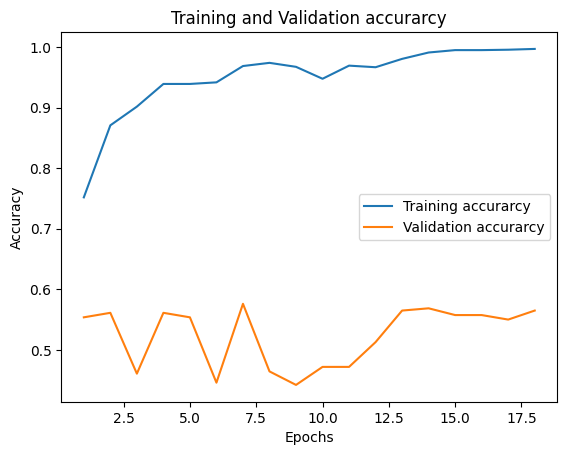

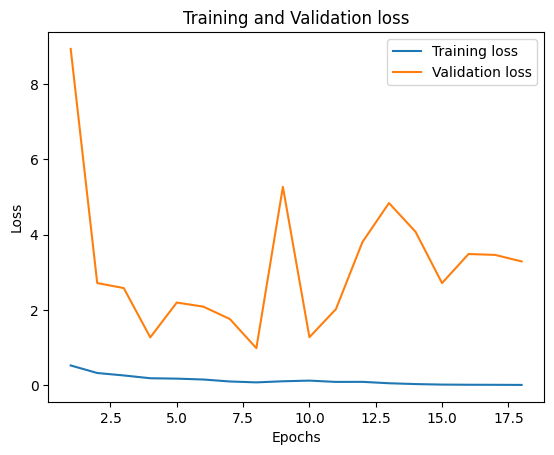

In [30]:
acc=history6.history['accuracy']
val_acc =history6.history['val_accuracy']
loss=history6.history['loss']
val_loss=history6.history['val_loss']
epochs=range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, label='Training accurarcy') 
plt.plot(epochs, val_acc, label='Validation accurarcy') 
plt.title('Training and Validation accurarcy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
#Train and validation Loss
plt.figure()
plt.plot(epochs, loss,label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [31]:
model = keras.models.load_model('model. NASNetMobile. h5')

In [32]:
results=model.evaluate(x_test,y_test, verbose=1)

25/25 [==============================] - 7s 80ms/step - loss: 3.1391 - accuracy: 0.5709 - precision_1: 0.4673 - recall_1: 0.1548


In [33]:
x_test=np.array(x_test)
y_test=np.array(y_test)
y_pre = model.predict(x_test,verbose=1).round()
y_pre= y_pre.flatten()
from sklearn.metrics import classification_report
target_names=['clean', 'Dusty']
print(confusion_matrix(y_test,y_pre))
print(classification_report(y_test, y_pre, target_names=target_names, digits=4))

25/25 [==============================] - 5s 60ms/step
[[389  57]
 [273  50]]
              precision    recall  f1-score   support

       clean     0.5876    0.8722    0.7022       446
       Dusty     0.4673    0.1548    0.2326       323

    accuracy                         0.5709       769
   macro avg     0.5275    0.5135    0.4674       769
weighted avg     0.5371    0.5709    0.5049       769



In [34]:
OPTIMIZER =Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
base_model=tf.keras.applications.MobileNetV2(
    input_shape=img_shape,
    include_top=False,
    weights="imagenet",
    classifier_activation="softmax"
)

    
base_model.trainable = True

x=base_model.output

x=GlobalAveragePooling2D()(x)

predictions=Dense(1, activation='sigmoid',name='Final')(x) 
model=Model(inputs=base_model.input , outputs=predictions)
#model.Load_weights(dire)
model.compile(loss='binary_crossentropy',optimizer=OPTIMIZER,metrics=['accuracy',keras.metrics.Precision(),keras.metrics.Recall()])

9406464/9406464 [==============================] - 0s 0us/step


In [35]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                      

In [36]:
callbacks = get_callbacks('MobileNetV2')
history8=model.fit( x_train,y_train, epochs=20, validation_data= [x_val,y_val],callbacks=[callbacks])

Epoch 1/20
48/48 [==============================] - ETA: 0s - loss: 0.6059 - accuracy: 0.6993 - precision_2: 0.6585 - recall_2: 0.5598
Epoch 1: saving model to model. MobileNetV2. h5


48/48 [==============================] - 67s 746ms/step - loss: 0.6059 - accuracy: 0.6993 - precision_2: 0.6585 - recall_2: 0.5598 - val_loss: 9.9333 - val_accuracy: 0.5576 - val_precision_2: 0.0000e+00 - val_recall_2: 0.0000e+00 - lr: 0.0010
Epoch 2/20
48/48 [==============================] - ETA: 0s - loss: 0.3896 - accuracy: 0.8194 - precision_2: 0.8200 - recall_2: 0.7193
Epoch 2: saving model to model. MobileNetV2. h5


48/48 [==============================] - 28s 583ms/step - loss: 0.3896 - accuracy: 0.8194 - precision_2: 0.8200 - recall_2: 0.7193 - val_loss: 8.2875 - val_accuracy: 0.5576 - val_precision_2: 0.0000e+00 - val_recall_2: 0.0000e+00 - lr: 0.0010
Epoch 3/20
48/48 [==============================] - ETA: 0s - loss: 0.2792 - accuracy: 0.8890 - precision_2: 0.8817 - recall_2: 0.8437
Epoch 3: saving model to model. MobileNetV2. h5


48/48 [==============================] - 28s 589ms/step - loss: 0.2792 - accuracy: 0.8890 - precision_2: 0.8817 - recall_2: 0.8437 - val_loss: 2.9777 - val_accuracy: 0.6134 - val_precision_2: 0.7778 - val_recall_2: 0.1765 - lr: 0.0010
Epoch 4/20
48/48 [==============================] - ETA: 0s - loss: 0.2463 - accuracy: 0.9048 - precision_2: 0.8875 - recall_2: 0.8804
Epoch 4: saving model to model. MobileNetV2. h5


48/48 [==============================] - 28s 589ms/step - loss: 0.2463 - accuracy: 0.9048 - precision_2: 0.8875 - recall_2: 0.8804 - val_loss: 12.3736 - val_accuracy: 0.5576 - val_precision_2: 0.0000e+00 - val_recall_2: 0.0000e+00 - lr: 0.0010
Epoch 5/20
48/48 [==============================] - ETA: 0s - loss: 0.2427 - accuracy: 0.9022 - precision_2: 0.8918 - recall_2: 0.8676
Epoch 5: saving model to model. MobileNetV2. h5


48/48 [==============================] - 28s 584ms/step - loss: 0.2427 - accuracy: 0.9022 - precision_2: 0.8918 - recall_2: 0.8676 - val_loss: 5.4610 - val_accuracy: 0.5576 - val_precision_2: 0.0000e+00 - val_recall_2: 0.0000e+00 - lr: 0.0010
Epoch 6/20
48/48 [==============================] - ETA: 0s - loss: 0.1542 - accuracy: 0.9416 - precision_2: 0.9283 - recall_2: 0.9298
Epoch 6: saving model to model. MobileNetV2. h5


48/48 [==============================] - 29s 610ms/step - loss: 0.1542 - accuracy: 0.9416 - precision_2: 0.9283 - recall_2: 0.9298 - val_loss: 10.6605 - val_accuracy: 0.5576 - val_precision_2: 0.0000e+00 - val_recall_2: 0.0000e+00 - lr: 0.0010
Epoch 7/20
48/48 [==============================] - ETA: 0s - loss: 0.1553 - accuracy: 0.9442 - precision_2: 0.9288 - recall_2: 0.9362
Epoch 7: saving model to model. MobileNetV2. h5


48/48 [==============================] - 28s 598ms/step - loss: 0.1553 - accuracy: 0.9442 - precision_2: 0.9288 - recall_2: 0.9362 - val_loss: 5.1343 - val_accuracy: 0.5576 - val_precision_2: 0.0000e+00 - val_recall_2: 0.0000e+00 - lr: 0.0010
Epoch 8/20
48/48 [==============================] - ETA: 0s - loss: 0.1470 - accuracy: 0.9435 - precision_2: 0.9328 - recall_2: 0.9298
Epoch 8: saving model to model. MobileNetV2. h5



Epoch 8: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
48/48 [==============================] - 29s 624ms/step - loss: 0.1470 - accuracy: 0.9435 - precision_2: 0.9328 - recall_2: 0.9298 - val_loss: 5.8716 - val_accuracy: 0.5576 - val_precision_2: 0.0000e+00 - val_recall_2: 0.0000e+00 - lr: 0.0010
Epoch 9/20
48/48 [==============================] - ETA: 0s - loss: 0.1004 - accuracy: 0.9685 - precision_2: 0.9603 - recall_2: 0.9633
Epoch 9: saving model to model. MobileNetV2. h5


48/48 [==============================] - 29s 609ms/step - loss: 0.1004 - accuracy: 0.9685 - precision_2: 0.9603 - recall_2: 0.9633 - val_loss: 4.9088 - val_accuracy: 0.5651 - val_precision_2: 1.0000 - val_recall_2: 0.0168 - lr: 5.0000e-04
Epoch 10/20
48/48 [==============================] - ETA: 0s - loss: 0.0370 - accuracy: 0.9882 - precision_2: 0.9856 - recall_2: 0.9856
Epoch 10: saving model to model. MobileNetV2. h5


48/48 [==============================] - 31s 654ms/step - loss: 0.0370 - accuracy: 0.9882 - precision_2: 0.9856 - recall_2: 0.9856 - val_loss: 5.4256 - val_accuracy: 0.5576 - val_precision_2: 0.0000e+00 - val_recall_2: 0.0000e+00 - lr: 5.0000e-04
Epoch 11/20
48/48 [==============================] - ETA: 0s - loss: 0.0428 - accuracy: 0.9849 - precision_2: 0.9824 - recall_2: 0.9809
Epoch 11: saving model to model. MobileNetV2. h5


48/48 [==============================] - 27s 573ms/step - loss: 0.0428 - accuracy: 0.9849 - precision_2: 0.9824 - recall_2: 0.9809 - val_loss: 8.1858 - val_accuracy: 0.5576 - val_precision_2: 0.0000e+00 - val_recall_2: 0.0000e+00 - lr: 5.0000e-04
Epoch 12/20
48/48 [==============================] - ETA: 0s - loss: 0.0275 - accuracy: 0.9888 - precision_2: 0.9826 - recall_2: 0.9904
Epoch 12: saving model to model. MobileNetV2. h5


48/48 [==============================] - 31s 659ms/step - loss: 0.0275 - accuracy: 0.9888 - precision_2: 0.9826 - recall_2: 0.9904 - val_loss: 8.2285 - val_accuracy: 0.5651 - val_precision_2: 1.0000 - val_recall_2: 0.0168 - lr: 5.0000e-04
Epoch 13/20
48/48 [==============================] - ETA: 0s - loss: 0.0241 - accuracy: 0.9908 - precision_2: 0.9888 - recall_2: 0.9888
Epoch 13: saving model to model. MobileNetV2. h5



Epoch 13: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
48/48 [==============================] - 27s 566ms/step - loss: 0.0241 - accuracy: 0.9908 - precision_2: 0.9888 - recall_2: 0.9888 - val_loss: 9.3008 - val_accuracy: 0.5651 - val_precision_2: 1.0000 - val_recall_2: 0.0168 - lr: 5.0000e-04


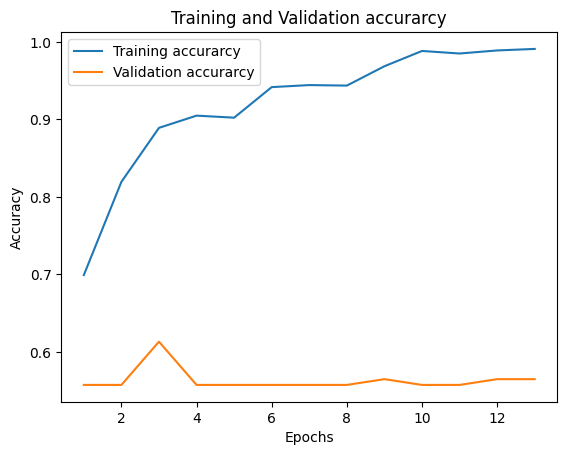

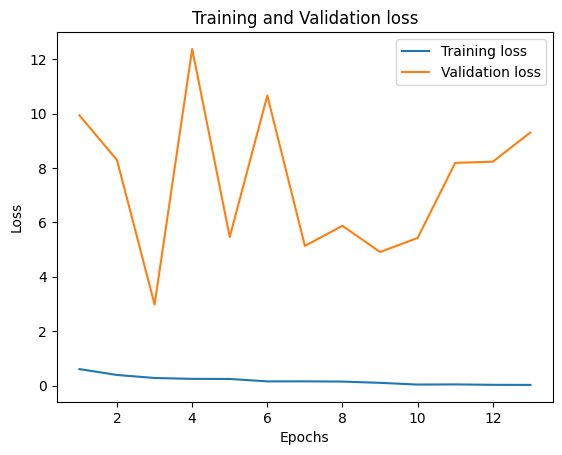

In [37]:
acc=history8.history['accuracy']
val_acc =history8.history['val_accuracy']
loss=history8.history['loss']
val_loss=history8.history['val_loss']
epochs=range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, label='Training accurarcy') 
plt.plot(epochs, val_acc, label='Validation accurarcy') 
plt.title('Training and Validation accurarcy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
#Train and validation Loss
plt.figure()
plt.plot(epochs, loss,label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [38]:
model = keras.models.load_model('model. MobileNetV2. h5')

In [39]:
results=model.evaluate(x_test,y_test, verbose=1)

25/25 [==============================] - 2s 55ms/step - loss: 8.7336 - accuracy: 0.5852 - precision_2: 0.8333 - recall_2: 0.0155


In [40]:
x_test=np.array(x_test)
y_test=np.array(y_test)
y_pre = model.predict(x_test,verbose=1).round()
y_pre= y_pre.flatten()
from sklearn.metrics import classification_report
target_names=['clean', 'Dusty']
print(confusion_matrix(y_test,y_pre))
print(classification_report(y_test, y_pre, target_names=target_names, digits=4))

25/25 [==============================] - 2s 37ms/step
[[445   1]
 [318   5]]
              precision    recall  f1-score   support

       clean     0.5832    0.9978    0.7361       446
       Dusty     0.8333    0.0155    0.0304       323

    accuracy                         0.5852       769
   macro avg     0.7083    0.5066    0.3833       769
weighted avg     0.6883    0.5852    0.4397       769



In [41]:
OPTIMIZER =Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
base_model=tf.keras.applications.ResNet101V2(
    input_shape=img_shape,
    include_top=False,
    weights="imagenet",
    classifier_activation="softmax"
)

    
base_model.trainable = True

x=base_model.output

x=GlobalAveragePooling2D()(x)

predictions=Dense(1, activation='sigmoid',name='Final')(x) 
model=Model(inputs=base_model.input , outputs=predictions)

#model.Load_weights(dire)

model.compile(loss='binary_crossentropy',optimizer=OPTIMIZER,metrics=['accuracy',keras.metrics.Precision(),keras.metrics.Recall()])

171317808/171317808 [==============================] - 6s 0us/step


In [42]:
print('Model Details are : ')
print(model.summary())

Model Details are : 
Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                       

In [43]:
callbacks = get_callbacks('ResNet101V2')
history5=model.fit( x_train,y_train, epochs=20, validation_data= [x_val,y_val],callbacks=[callbacks])

Epoch 1/20
48/48 [==============================] - ETA: 0s - loss: 0.6740 - accuracy: 0.6533 - precision_3: 0.5915 - recall_3: 0.5104
Epoch 1: saving model to model. ResNet101V2. h5


48/48 [==============================] - 170s 2s/step - loss: 0.6740 - accuracy: 0.6533 - precision_3: 0.5915 - recall_3: 0.5104 - val_loss: 9225.2129 - val_accuracy: 0.5576 - val_precision_3: 0.0000e+00 - val_recall_3: 0.0000e+00 - lr: 0.0010
Epoch 2/20
48/48 [==============================] - ETA: 0s - loss: 0.5647 - accuracy: 0.7321 - precision_3: 0.7248 - recall_3: 0.5630
Epoch 2: saving model to model. ResNet101V2. h5


48/48 [==============================] - 106s 2s/step - loss: 0.5647 - accuracy: 0.7321 - precision_3: 0.7248 - recall_3: 0.5630 - val_loss: 39.8491 - val_accuracy: 0.5576 - val_precision_3: 0.0000e+00 - val_recall_3: 0.0000e+00 - lr: 0.0010
Epoch 3/20
48/48 [==============================] - ETA: 0s - loss: 0.5374 - accuracy: 0.7505 - precision_3: 0.7485 - recall_3: 0.5933
Epoch 3: saving model to model. ResNet101V2. h5


48/48 [==============================] - 109s 2s/step - loss: 0.5374 - accuracy: 0.7505 - precision_3: 0.7485 - recall_3: 0.5933 - val_loss: 12.4913 - val_accuracy: 0.5539 - val_precision_3: 0.0000e+00 - val_recall_3: 0.0000e+00 - lr: 0.0010
Epoch 4/20
48/48 [==============================] - ETA: 0s - loss: 0.5027 - accuracy: 0.7748 - precision_3: 0.7649 - recall_3: 0.6539
Epoch 4: saving model to model. ResNet101V2. h5


48/48 [==============================] - 106s 2s/step - loss: 0.5027 - accuracy: 0.7748 - precision_3: 0.7649 - recall_3: 0.6539 - val_loss: 1.8115 - val_accuracy: 0.5539 - val_precision_3: 0.0000e+00 - val_recall_3: 0.0000e+00 - lr: 0.0010
Epoch 5/20
48/48 [==============================] - ETA: 0s - loss: 0.4642 - accuracy: 0.7905 - precision_3: 0.7800 - recall_3: 0.6842
Epoch 5: saving model to model. ResNet101V2. h5


48/48 [==============================] - 102s 2s/step - loss: 0.4642 - accuracy: 0.7905 - precision_3: 0.7800 - recall_3: 0.6842 - val_loss: 0.6384 - val_accuracy: 0.7732 - val_precision_3: 0.9531 - val_recall_3: 0.5126 - lr: 0.0010
Epoch 6/20
48/48 [==============================] - ETA: 0s - loss: 0.4159 - accuracy: 0.8234 - precision_3: 0.8266 - recall_3: 0.7225
Epoch 6: saving model to model. ResNet101V2. h5


48/48 [==============================] - 102s 2s/step - loss: 0.4159 - accuracy: 0.8234 - precision_3: 0.8266 - recall_3: 0.7225 - val_loss: 0.9420 - val_accuracy: 0.7138 - val_precision_3: 0.9773 - val_recall_3: 0.3613 - lr: 0.0010
Epoch 7/20
48/48 [==============================] - ETA: 0s - loss: 0.3906 - accuracy: 0.8365 - precision_3: 0.8412 - recall_3: 0.7432
Epoch 7: saving model to model. ResNet101V2. h5


48/48 [==============================] - 102s 2s/step - loss: 0.3906 - accuracy: 0.8365 - precision_3: 0.8412 - recall_3: 0.7432 - val_loss: 0.5076 - val_accuracy: 0.7844 - val_precision_3: 0.8506 - val_recall_3: 0.6218 - lr: 0.0010
Epoch 8/20
48/48 [==============================] - ETA: 0s - loss: 0.3451 - accuracy: 0.8615 - precision_3: 0.8649 - recall_3: 0.7863
Epoch 8: saving model to model. ResNet101V2. h5


48/48 [==============================] - 108s 2s/step - loss: 0.3451 - accuracy: 0.8615 - precision_3: 0.8649 - recall_3: 0.7863 - val_loss: 0.9822 - val_accuracy: 0.6654 - val_precision_3: 0.8372 - val_recall_3: 0.3025 - lr: 0.0010
Epoch 9/20
48/48 [==============================] - ETA: 0s - loss: 0.3555 - accuracy: 0.8536 - precision_3: 0.8531 - recall_3: 0.7783
Epoch 9: saving model to model. ResNet101V2. h5


48/48 [==============================] - 102s 2s/step - loss: 0.3555 - accuracy: 0.8536 - precision_3: 0.8531 - recall_3: 0.7783 - val_loss: 12.2188 - val_accuracy: 0.5613 - val_precision_3: 1.0000 - val_recall_3: 0.0084 - lr: 0.0010
Epoch 10/20
48/48 [==============================] - ETA: 0s - loss: 0.2886 - accuracy: 0.8759 - precision_3: 0.8724 - recall_3: 0.8182
Epoch 10: saving model to model. ResNet101V2. h5


48/48 [==============================] - 100s 2s/step - loss: 0.2886 - accuracy: 0.8759 - precision_3: 0.8724 - recall_3: 0.8182 - val_loss: 2.8218 - val_accuracy: 0.5874 - val_precision_3: 0.7000 - val_recall_3: 0.1176 - lr: 0.0010
Epoch 11/20
48/48 [==============================] - ETA: 0s - loss: 0.2766 - accuracy: 0.8812 - precision_3: 0.8805 - recall_3: 0.8230
Epoch 11: saving model to model. ResNet101V2. h5


48/48 [==============================] - 104s 2s/step - loss: 0.2766 - accuracy: 0.8812 - precision_3: 0.8805 - recall_3: 0.8230 - val_loss: 1.6355 - val_accuracy: 0.6691 - val_precision_3: 0.8409 - val_recall_3: 0.3109 - lr: 0.0010
Epoch 12/20
48/48 [==============================] - ETA: 0s - loss: 0.2087 - accuracy: 0.9212 - precision_3: 0.9109 - recall_3: 0.8963
Epoch 12: saving model to model. ResNet101V2. h5



Epoch 12: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
48/48 [==============================] - 108s 2s/step - loss: 0.2087 - accuracy: 0.9212 - precision_3: 0.9109 - recall_3: 0.8963 - val_loss: 0.9902 - val_accuracy: 0.7807 - val_precision_3: 0.8846 - val_recall_3: 0.5798 - lr: 0.0010
Epoch 13/20
48/48 [==============================] - ETA: 0s - loss: 0.1251 - accuracy: 0.9554 - precision_3: 0.9620 - recall_3: 0.9282
Epoch 13: saving model to model. ResNet101V2. h5


48/48 [==============================] - 106s 2s/step - loss: 0.1251 - accuracy: 0.9554 - precision_3: 0.9620 - recall_3: 0.9282 - val_loss: 1.7280 - val_accuracy: 0.6766 - val_precision_3: 0.9000 - val_recall_3: 0.3025 - lr: 5.0000e-04
Epoch 14/20
48/48 [==============================] - ETA: 0s - loss: 0.0816 - accuracy: 0.9724 - precision_3: 0.9756 - recall_3: 0.9569
Epoch 14: saving model to model. ResNet101V2. h5


48/48 [==============================] - 104s 2s/step - loss: 0.0816 - accuracy: 0.9724 - precision_3: 0.9756 - recall_3: 0.9569 - val_loss: 0.6028 - val_accuracy: 0.8104 - val_precision_3: 0.8617 - val_recall_3: 0.6807 - lr: 5.0000e-04
Epoch 15/20
48/48 [==============================] - ETA: 0s - loss: 0.0544 - accuracy: 0.9849 - precision_3: 0.9855 - recall_3: 0.9777
Epoch 15: saving model to model. ResNet101V2. h5


48/48 [==============================] - 101s 2s/step - loss: 0.0544 - accuracy: 0.9849 - precision_3: 0.9855 - recall_3: 0.9777 - val_loss: 0.6777 - val_accuracy: 0.7881 - val_precision_3: 0.7500 - val_recall_3: 0.7815 - lr: 5.0000e-04
Epoch 16/20
48/48 [==============================] - ETA: 0s - loss: 0.0510 - accuracy: 0.9875 - precision_3: 0.9872 - recall_3: 0.9825
Epoch 16: saving model to model. ResNet101V2. h5


48/48 [==============================] - 98s 2s/step - loss: 0.0510 - accuracy: 0.9875 - precision_3: 0.9872 - recall_3: 0.9825 - val_loss: 0.5922 - val_accuracy: 0.8513 - val_precision_3: 0.8062 - val_recall_3: 0.8739 - lr: 5.0000e-04
Epoch 17/20
48/48 [==============================] - ETA: 0s - loss: 0.0361 - accuracy: 0.9908 - precision_3: 0.9920 - recall_3: 0.9856
Epoch 17: saving model to model. ResNet101V2. h5



Epoch 17: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
48/48 [==============================] - 106s 2s/step - loss: 0.0361 - accuracy: 0.9908 - precision_3: 0.9920 - recall_3: 0.9856 - val_loss: 0.6558 - val_accuracy: 0.8216 - val_precision_3: 0.8198 - val_recall_3: 0.7647 - lr: 5.0000e-04


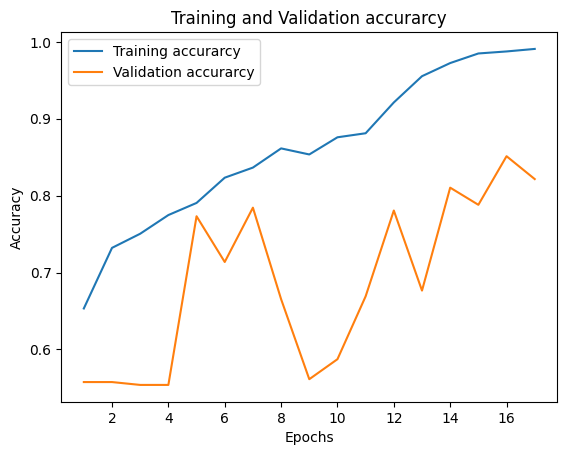

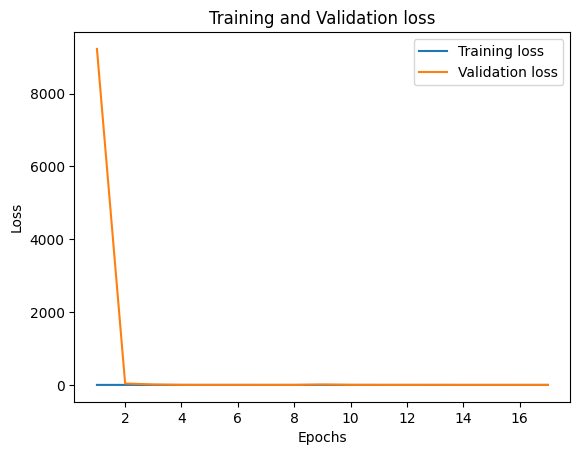

In [44]:
acc=history5.history['accuracy']
val_acc =history5.history['val_accuracy']
loss=history5.history['loss']
val_loss=history5.history['val_loss']
epochs=range(1, len(acc) + 1)
#Train and validation accuracy
plt.plot(epochs, acc, label='Training accurarcy') 
plt.plot(epochs, val_acc, label='Validation accurarcy') 
plt.title('Training and Validation accurarcy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
#Train and validation Loss
plt.figure()
plt.plot(epochs, loss,label='Training loss')
plt.plot(epochs, val_loss, label='Validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [45]:
model = keras.models.load_model('model. ResNet101V2. h5')

In [46]:
results=model.evaluate(x_test,y_test, verbose=1)

25/25 [==============================] - 6s 156ms/step - loss: 0.7093 - accuracy: 0.7971 - precision_3: 0.7738 - recall_3: 0.7307


In [47]:
x_test=np.array(x_test)
y_test=np.array(y_test)
y_pre = model.predict(x_test,verbose=1).round()
y_pre= y_pre.flatten()
from sklearn.metrics import classification_report
target_names=['clean', 'Dusty']
print(confusion_matrix(y_test,y_pre))
print(classification_report(y_test, y_pre, target_names=target_names, digits=4))

25/25 [==============================] - 6s 161ms/step
[[377  69]
 [ 87 236]]
              precision    recall  f1-score   support

       clean     0.8125    0.8453    0.8286       446
       Dusty     0.7738    0.7307    0.7516       323

    accuracy                         0.7971       769
   macro avg     0.7931    0.7880    0.7901       769
weighted avg     0.7962    0.7971    0.7962       769

